# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

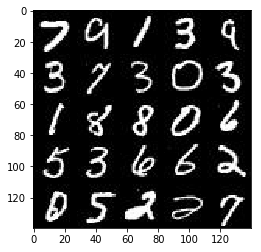

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

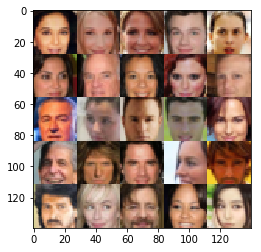

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    
    input_image = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name='input_image')
    Z = tf.placeholder(tf.float32, [None, z_dim], name='Z')
    lr = tf.placeholder(tf.float32, name='learning_rate')
    
    return input_image, Z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [6]:
def discriminator(images, reuse=False, kp=1.0, alpha=0.01):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
    with tf.variable_scope('discriminator', reuse=reuse):
        
        # Input layer is 28x28x{1 or 3}
        x = tf.layers.conv2d(images, 64, 5, strides=2, padding='same',
                             kernel_initializer=tf.contrib.layers.xavier_initializer())
        x = tf.maximum(alpha*x, x)
        
        x = tf.layers.dropout(x, rate=kp)
        # 14x14x64

        x = tf.layers.conv2d(x, 128, 5, strides=2, padding='same',
                            kernel_initializer=tf.contrib.layers.xavier_initializer())
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha*x, x)

        x = tf.layers.dropout(x, rate=kp)
        
        # 7x7x128 (width/height not divisible by 2)

        x = tf.layers.conv2d(x, 256, 5, strides=2, padding='same',
                            kernel_initializer=tf.contrib.layers.xavier_initializer())
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha*x, x)
        
        x = tf.layers.dropout(x, rate=kp)
        
        # 4x4x256
        
        x = tf.layers.conv2d(x, 512, 5, strides=2, padding='same',
                            kernel_initializer=tf.contrib.layers.xavier_initializer())
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha*x, x)

        # 2x2x512

        x_flat = tf.reshape(x, (-1, 2*2*512))

        x = tf.layers.dropout(x, rate=kp)

        logits = tf.layers.dense(x_flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, kp=1.0, alpha=0.01):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):
        x = tf.layers.dense(z, 2*2*512)
        
        x = tf.reshape(x, [-1, 2, 2, 512])
        
        x = tf.layers.dropout(x, rate=kp)
        
        # 2x2x512
        x = tf.layers.conv2d_transpose(x, 256, 5, strides=2, padding='same',
                            kernel_initializer=tf.contrib.layers.xavier_initializer())

        # 4x4x256
        
        x = tf.layers.conv2d_transpose(x, 128, 5, strides=2, padding='same',
                            kernel_initializer=tf.contrib.layers.xavier_initializer())
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha*x, x)
        x = tf.layers.dropout(x, rate=kp)

        # 8x8x128

        x = x[:, :7, :7, :] #truncate at 7x7

        # 7x7x128
        
        x = tf.layers.conv2d_transpose(x, 64, 5, strides=2, padding='same',
                            kernel_initializer=tf.contrib.layers.xavier_initializer())
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha*x, x)
        x = tf.layers.dropout(x, rate=kp)

        # 14x14x64
        
        x = tf.layers.conv2d_transpose(x, out_channel_dim, 5, strides=2, padding='same',
                            kernel_initializer=tf.contrib.layers.xavier_initializer())
        # 28 x 28 x out_channel_dim;

        out = tf.tanh(x)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, kp=1.0, alpha=0.01, smooth=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    
    g_model = generator(input_z, out_channel_dim, is_train=True, kp=kp, alpha=alpha)

    d_model_real, d_logits_real = discriminator(input_real, reuse=False, kp=kp, alpha=alpha)
    
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, kp=kp, alpha=alpha)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=(1-smooth)*tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss,var_list=d_vars)
        #d_train_opt = tf.train.GradientDescentOptimizer(learning_rate).minimize(d_loss,var_list=d_vars) 
        g_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss,var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
#modified below to add the parameter kb

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, kp, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z, kp: 1.0})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, keep_prob, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    
    _, image_width, image_weight, image_dims = data_shape
    
    input_real, input_z, lr = model_inputs(image_width, image_weight, image_dims, z_dim)
    
    kp = tf.placeholder(tf.float32, name="keep_prob")
    
    d_loss, g_loss = model_loss(input_real, input_z, image_dims, kp=kp)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    sample_z = np.random.uniform(-1, 1, size=(36, z_dim))
    
    samples, losses = [], []
    
    steps = 0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            batch_count = 0
            for batch_images in get_batches(batch_size):
                batch_images = 2.0 * batch_images #rescale images to -1..+1
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={
                    input_real: batch_images,
                    input_z: batch_z,
                    lr: learning_rate,
                    kp: keep_prob
                })

                for i in range(2):
                    _ = sess.run(g_opt, feed_dict={
                        input_z: batch_z,
                        input_real: batch_images,
                        lr: learning_rate,
                        kp: keep_prob
                    })
                
                # At the end of each epoch, get the losses and print them out
                train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images, kp: 1.0})
                train_loss_g = g_loss.eval({input_z: batch_z, kp: 1.0})

                print("Epoch {}, step {}".format(epoch_i+1, steps+1),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))

                # Save losses to view after training
                losses.append((train_loss_d, train_loss_g))

                if steps % 100 == 0:
                   show_generator_output(sess, 36, input_z, kp, image_dims, "L" if image_dims == 1 else "RGB")
                
                steps += 1
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1, step 1 Discriminator Loss: 3.7427... Generator Loss: 2.8551


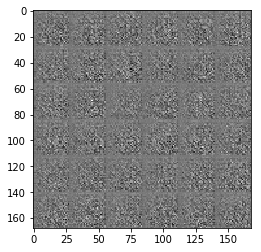

Epoch 1, step 2 Discriminator Loss: 3.5672... Generator Loss: 0.0574
Epoch 1, step 3 Discriminator Loss: 3.6658... Generator Loss: 0.0516
Epoch 1, step 4 Discriminator Loss: 2.3239... Generator Loss: 0.1791
Epoch 1, step 5 Discriminator Loss: 1.9644... Generator Loss: 0.3048
Epoch 1, step 6 Discriminator Loss: 2.4868... Generator Loss: 0.1400
Epoch 1, step 7 Discriminator Loss: 3.2766... Generator Loss: 0.0571
Epoch 1, step 8 Discriminator Loss: 1.6073... Generator Loss: 0.9017
Epoch 1, step 9 Discriminator Loss: 4.7968... Generator Loss: 0.0182
Epoch 1, step 10 Discriminator Loss: 1.8291... Generator Loss: 1.0617
Epoch 1, step 11 Discriminator Loss: 2.9756... Generator Loss: 0.0810
Epoch 1, step 12 Discriminator Loss: 2.8420... Generator Loss: 0.0910
Epoch 1, step 13 Discriminator Loss: 2.6531... Generator Loss: 0.1181
Epoch 1, step 14 Discriminator Loss: 2.3763... Generator Loss: 0.1731
Epoch 1, step 15 Discriminator Loss: 4.3881... Generator Loss: 0.0225
Epoch 1, step 16 Discriminat

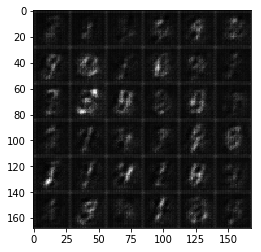

Epoch 1, step 102 Discriminator Loss: 1.2069... Generator Loss: 0.6250
Epoch 1, step 103 Discriminator Loss: 1.0137... Generator Loss: 1.2323
Epoch 1, step 104 Discriminator Loss: 1.5131... Generator Loss: 0.4050
Epoch 1, step 105 Discriminator Loss: 1.1136... Generator Loss: 1.4790
Epoch 1, step 106 Discriminator Loss: 1.4172... Generator Loss: 0.4631
Epoch 1, step 107 Discriminator Loss: 1.1844... Generator Loss: 1.3262
Epoch 1, step 108 Discriminator Loss: 1.8077... Generator Loss: 0.2886
Epoch 1, step 109 Discriminator Loss: 1.1523... Generator Loss: 1.5009
Epoch 1, step 110 Discriminator Loss: 1.4144... Generator Loss: 0.4900
Epoch 1, step 111 Discriminator Loss: 1.0904... Generator Loss: 1.4325
Epoch 1, step 112 Discriminator Loss: 1.7893... Generator Loss: 0.3098
Epoch 1, step 113 Discriminator Loss: 1.1494... Generator Loss: 1.2302
Epoch 1, step 114 Discriminator Loss: 1.5205... Generator Loss: 0.3989
Epoch 1, step 115 Discriminator Loss: 1.2316... Generator Loss: 0.6807
Epoch 

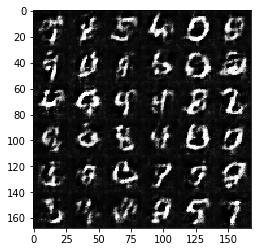

Epoch 1, step 202 Discriminator Loss: 1.2489... Generator Loss: 0.6051
Epoch 1, step 203 Discriminator Loss: 1.1295... Generator Loss: 0.6856
Epoch 1, step 204 Discriminator Loss: 1.1288... Generator Loss: 1.1516
Epoch 1, step 205 Discriminator Loss: 2.4925... Generator Loss: 0.1581
Epoch 1, step 206 Discriminator Loss: 1.2733... Generator Loss: 2.9661
Epoch 1, step 207 Discriminator Loss: 0.9179... Generator Loss: 1.0387
Epoch 1, step 208 Discriminator Loss: 1.6638... Generator Loss: 0.3891
Epoch 1, step 209 Discriminator Loss: 1.1086... Generator Loss: 0.7967
Epoch 1, step 210 Discriminator Loss: 1.0228... Generator Loss: 0.9778
Epoch 1, step 211 Discriminator Loss: 1.3443... Generator Loss: 0.5049
Epoch 1, step 212 Discriminator Loss: 1.0123... Generator Loss: 0.8813
Epoch 1, step 213 Discriminator Loss: 1.0123... Generator Loss: 0.8319
Epoch 1, step 214 Discriminator Loss: 1.2355... Generator Loss: 0.6237
Epoch 1, step 215 Discriminator Loss: 1.4353... Generator Loss: 0.4412
Epoch 

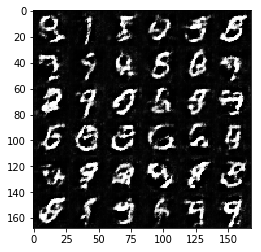

Epoch 1, step 302 Discriminator Loss: 0.9700... Generator Loss: 0.9651
Epoch 1, step 303 Discriminator Loss: 1.0576... Generator Loss: 0.8302
Epoch 1, step 304 Discriminator Loss: 1.3454... Generator Loss: 0.5243
Epoch 1, step 305 Discriminator Loss: 1.0587... Generator Loss: 0.7971
Epoch 1, step 306 Discriminator Loss: 1.0816... Generator Loss: 0.7395
Epoch 1, step 307 Discriminator Loss: 2.2595... Generator Loss: 0.1979
Epoch 1, step 308 Discriminator Loss: 0.9680... Generator Loss: 1.1854
Epoch 1, step 309 Discriminator Loss: 0.9802... Generator Loss: 0.8815
Epoch 1, step 310 Discriminator Loss: 1.8532... Generator Loss: 0.2974
Epoch 1, step 311 Discriminator Loss: 1.0494... Generator Loss: 1.8423
Epoch 1, step 312 Discriminator Loss: 2.5505... Generator Loss: 0.1586
Epoch 1, step 313 Discriminator Loss: 1.5250... Generator Loss: 2.8847
Epoch 1, step 314 Discriminator Loss: 1.7988... Generator Loss: 0.3369
Epoch 1, step 315 Discriminator Loss: 1.0932... Generator Loss: 0.7596
Epoch 

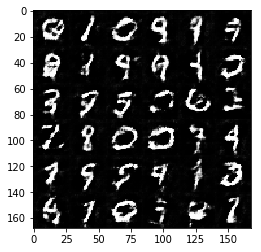

Epoch 1, step 402 Discriminator Loss: 1.4576... Generator Loss: 0.5203
Epoch 1, step 403 Discriminator Loss: 1.0518... Generator Loss: 1.0506
Epoch 1, step 404 Discriminator Loss: 2.1769... Generator Loss: 0.2171
Epoch 1, step 405 Discriminator Loss: 0.9769... Generator Loss: 2.3963
Epoch 1, step 406 Discriminator Loss: 1.5351... Generator Loss: 0.4242
Epoch 1, step 407 Discriminator Loss: 0.9241... Generator Loss: 1.0964
Epoch 1, step 408 Discriminator Loss: 1.1165... Generator Loss: 0.7727
Epoch 1, step 409 Discriminator Loss: 1.3152... Generator Loss: 0.5212
Epoch 1, step 410 Discriminator Loss: 0.9799... Generator Loss: 0.8607
Epoch 1, step 411 Discriminator Loss: 1.4353... Generator Loss: 0.4619
Epoch 1, step 412 Discriminator Loss: 0.8472... Generator Loss: 1.1211
Epoch 1, step 413 Discriminator Loss: 1.1228... Generator Loss: 0.6931
Epoch 1, step 414 Discriminator Loss: 1.0940... Generator Loss: 0.7488
Epoch 1, step 415 Discriminator Loss: 0.9830... Generator Loss: 0.8083
Epoch 

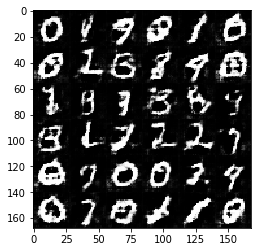

Epoch 1, step 502 Discriminator Loss: 1.1555... Generator Loss: 0.7087
Epoch 1, step 503 Discriminator Loss: 1.0630... Generator Loss: 0.7842
Epoch 1, step 504 Discriminator Loss: 0.9547... Generator Loss: 0.9230
Epoch 1, step 505 Discriminator Loss: 1.5220... Generator Loss: 0.4310
Epoch 1, step 506 Discriminator Loss: 0.7815... Generator Loss: 1.2754
Epoch 1, step 507 Discriminator Loss: 1.2642... Generator Loss: 0.5753
Epoch 1, step 508 Discriminator Loss: 1.2334... Generator Loss: 0.5712
Epoch 1, step 509 Discriminator Loss: 2.0816... Generator Loss: 0.2297
Epoch 1, step 510 Discriminator Loss: 1.0804... Generator Loss: 2.4774
Epoch 1, step 511 Discriminator Loss: 1.6161... Generator Loss: 0.4902
Epoch 1, step 512 Discriminator Loss: 1.1144... Generator Loss: 0.7182
Epoch 1, step 513 Discriminator Loss: 0.8230... Generator Loss: 2.2164
Epoch 1, step 514 Discriminator Loss: 0.7429... Generator Loss: 1.2616
Epoch 1, step 515 Discriminator Loss: 1.2357... Generator Loss: 0.7463
Epoch 

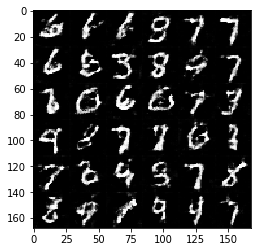

Epoch 1, step 602 Discriminator Loss: 1.0919... Generator Loss: 1.5196
Epoch 1, step 603 Discriminator Loss: 1.2867... Generator Loss: 0.5596
Epoch 1, step 604 Discriminator Loss: 1.2783... Generator Loss: 0.5662
Epoch 1, step 605 Discriminator Loss: 1.0204... Generator Loss: 1.2168
Epoch 1, step 606 Discriminator Loss: 1.3716... Generator Loss: 0.5122
Epoch 1, step 607 Discriminator Loss: 0.9162... Generator Loss: 0.9391
Epoch 1, step 608 Discriminator Loss: 0.9979... Generator Loss: 0.8456
Epoch 1, step 609 Discriminator Loss: 1.4990... Generator Loss: 0.4326
Epoch 1, step 610 Discriminator Loss: 1.4717... Generator Loss: 0.4461
Epoch 1, step 611 Discriminator Loss: 1.0351... Generator Loss: 2.4511
Epoch 1, step 612 Discriminator Loss: 2.1214... Generator Loss: 0.2506
Epoch 1, step 613 Discriminator Loss: 0.9533... Generator Loss: 0.9286
Epoch 1, step 614 Discriminator Loss: 1.0290... Generator Loss: 1.0218
Epoch 1, step 615 Discriminator Loss: 1.1880... Generator Loss: 0.6440
Epoch 

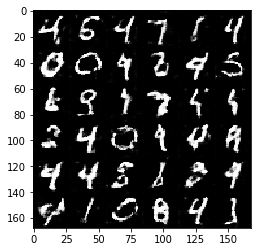

Epoch 1, step 702 Discriminator Loss: 0.8412... Generator Loss: 1.0102
Epoch 1, step 703 Discriminator Loss: 1.1594... Generator Loss: 0.6674
Epoch 1, step 704 Discriminator Loss: 0.6783... Generator Loss: 1.5494
Epoch 1, step 705 Discriminator Loss: 1.8684... Generator Loss: 0.2812
Epoch 1, step 706 Discriminator Loss: 1.3114... Generator Loss: 0.5818
Epoch 1, step 707 Discriminator Loss: 1.1874... Generator Loss: 1.1484
Epoch 1, step 708 Discriminator Loss: 2.7361... Generator Loss: 0.1460
Epoch 1, step 709 Discriminator Loss: 1.8293... Generator Loss: 3.0959
Epoch 1, step 710 Discriminator Loss: 0.8303... Generator Loss: 1.0819
Epoch 1, step 711 Discriminator Loss: 1.2907... Generator Loss: 0.5674
Epoch 1, step 712 Discriminator Loss: 0.8907... Generator Loss: 0.9950
Epoch 1, step 713 Discriminator Loss: 0.9036... Generator Loss: 1.2139
Epoch 1, step 714 Discriminator Loss: 0.7891... Generator Loss: 1.2362
Epoch 1, step 715 Discriminator Loss: 1.6494... Generator Loss: 0.3915
Epoch 

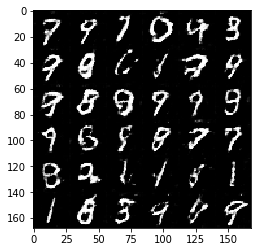

Epoch 1, step 802 Discriminator Loss: 1.2884... Generator Loss: 0.5298
Epoch 1, step 803 Discriminator Loss: 2.0871... Generator Loss: 0.2658
Epoch 1, step 804 Discriminator Loss: 0.9949... Generator Loss: 1.7255
Epoch 1, step 805 Discriminator Loss: 0.7163... Generator Loss: 1.9812
Epoch 1, step 806 Discriminator Loss: 1.4519... Generator Loss: 0.4525
Epoch 1, step 807 Discriminator Loss: 1.5615... Generator Loss: 0.3843
Epoch 1, step 808 Discriminator Loss: 0.9202... Generator Loss: 1.1345
Epoch 1, step 809 Discriminator Loss: 0.7202... Generator Loss: 1.4108
Epoch 1, step 810 Discriminator Loss: 1.2732... Generator Loss: 0.5948
Epoch 1, step 811 Discriminator Loss: 1.2835... Generator Loss: 0.5495
Epoch 1, step 812 Discriminator Loss: 1.1033... Generator Loss: 0.7685
Epoch 1, step 813 Discriminator Loss: 0.9837... Generator Loss: 0.9805
Epoch 1, step 814 Discriminator Loss: 1.6901... Generator Loss: 0.3692
Epoch 1, step 815 Discriminator Loss: 1.1101... Generator Loss: 0.8335
Epoch 

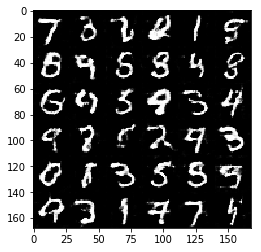

Epoch 1, step 902 Discriminator Loss: 0.9515... Generator Loss: 0.8575
Epoch 1, step 903 Discriminator Loss: 1.7991... Generator Loss: 0.3232
Epoch 1, step 904 Discriminator Loss: 0.7415... Generator Loss: 1.5122
Epoch 1, step 905 Discriminator Loss: 0.5451... Generator Loss: 1.9680
Epoch 1, step 906 Discriminator Loss: 1.7208... Generator Loss: 0.3681
Epoch 1, step 907 Discriminator Loss: 1.6949... Generator Loss: 0.3397
Epoch 1, step 908 Discriminator Loss: 1.0552... Generator Loss: 0.7688
Epoch 1, step 909 Discriminator Loss: 0.8464... Generator Loss: 1.2069
Epoch 1, step 910 Discriminator Loss: 1.0147... Generator Loss: 0.8408
Epoch 1, step 911 Discriminator Loss: 1.6202... Generator Loss: 0.3753
Epoch 1, step 912 Discriminator Loss: 1.2256... Generator Loss: 0.6003
Epoch 1, step 913 Discriminator Loss: 1.2816... Generator Loss: 0.5769
Epoch 1, step 914 Discriminator Loss: 1.5613... Generator Loss: 0.4222
Epoch 1, step 915 Discriminator Loss: 1.8848... Generator Loss: 0.2695
Epoch 

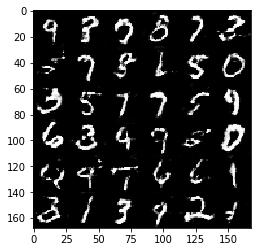

Epoch 1, step 1002 Discriminator Loss: 0.9533... Generator Loss: 1.0553
Epoch 1, step 1003 Discriminator Loss: 1.2516... Generator Loss: 0.5672
Epoch 1, step 1004 Discriminator Loss: 1.0923... Generator Loss: 0.6821
Epoch 1, step 1005 Discriminator Loss: 1.1270... Generator Loss: 0.6538
Epoch 1, step 1006 Discriminator Loss: 1.6426... Generator Loss: 0.3666
Epoch 1, step 1007 Discriminator Loss: 1.0608... Generator Loss: 0.7267
Epoch 1, step 1008 Discriminator Loss: 1.0032... Generator Loss: 1.0796
Epoch 1, step 1009 Discriminator Loss: 1.7562... Generator Loss: 0.3558
Epoch 1, step 1010 Discriminator Loss: 1.2982... Generator Loss: 0.5488
Epoch 1, step 1011 Discriminator Loss: 1.1459... Generator Loss: 0.6550
Epoch 1, step 1012 Discriminator Loss: 1.0742... Generator Loss: 1.4039
Epoch 1, step 1013 Discriminator Loss: 1.4193... Generator Loss: 0.5548
Epoch 1, step 1014 Discriminator Loss: 1.1786... Generator Loss: 0.6452
Epoch 1, step 1015 Discriminator Loss: 1.0951... Generator Loss:

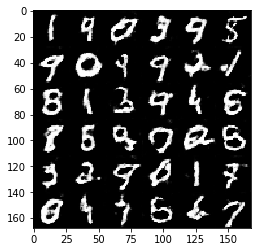

Epoch 1, step 1102 Discriminator Loss: 1.6088... Generator Loss: 0.3967
Epoch 1, step 1103 Discriminator Loss: 1.3760... Generator Loss: 0.5086
Epoch 1, step 1104 Discriminator Loss: 0.9979... Generator Loss: 0.8378
Epoch 1, step 1105 Discriminator Loss: 1.1850... Generator Loss: 0.6251
Epoch 1, step 1106 Discriminator Loss: 1.9509... Generator Loss: 0.2975
Epoch 1, step 1107 Discriminator Loss: 0.9626... Generator Loss: 0.8870
Epoch 1, step 1108 Discriminator Loss: 0.7854... Generator Loss: 1.6310
Epoch 1, step 1109 Discriminator Loss: 0.7656... Generator Loss: 1.2817
Epoch 1, step 1110 Discriminator Loss: 1.9524... Generator Loss: 0.2852
Epoch 1, step 1111 Discriminator Loss: 1.4734... Generator Loss: 0.4342
Epoch 1, step 1112 Discriminator Loss: 0.9796... Generator Loss: 1.3500
Epoch 1, step 1113 Discriminator Loss: 1.5944... Generator Loss: 0.5016
Epoch 1, step 1114 Discriminator Loss: 1.5172... Generator Loss: 0.4305
Epoch 1, step 1115 Discriminator Loss: 1.1681... Generator Loss:

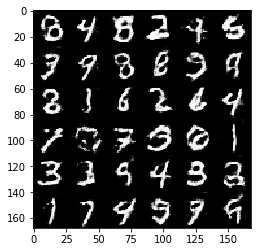

Epoch 1, step 1202 Discriminator Loss: 1.3323... Generator Loss: 0.5261
Epoch 1, step 1203 Discriminator Loss: 0.9364... Generator Loss: 0.8879
Epoch 1, step 1204 Discriminator Loss: 0.9036... Generator Loss: 1.7079
Epoch 1, step 1205 Discriminator Loss: 2.0444... Generator Loss: 0.3234
Epoch 1, step 1206 Discriminator Loss: 1.2249... Generator Loss: 0.9634
Epoch 1, step 1207 Discriminator Loss: 1.0217... Generator Loss: 0.8620
Epoch 1, step 1208 Discriminator Loss: 1.0514... Generator Loss: 0.7280
Epoch 1, step 1209 Discriminator Loss: 0.8845... Generator Loss: 0.9602
Epoch 1, step 1210 Discriminator Loss: 1.3335... Generator Loss: 0.5470
Epoch 1, step 1211 Discriminator Loss: 1.2023... Generator Loss: 0.6250
Epoch 1, step 1212 Discriminator Loss: 0.8321... Generator Loss: 1.1007
Epoch 1, step 1213 Discriminator Loss: 1.2108... Generator Loss: 0.6028
Epoch 1, step 1214 Discriminator Loss: 1.2684... Generator Loss: 0.6089
Epoch 1, step 1215 Discriminator Loss: 1.1456... Generator Loss:

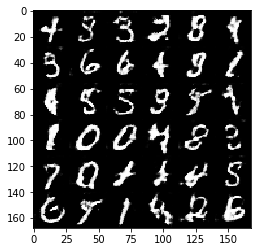

Epoch 1, step 1302 Discriminator Loss: 1.9177... Generator Loss: 0.2773
Epoch 1, step 1303 Discriminator Loss: 1.3177... Generator Loss: 0.6419
Epoch 1, step 1304 Discriminator Loss: 1.3992... Generator Loss: 0.5398
Epoch 1, step 1305 Discriminator Loss: 0.7548... Generator Loss: 1.2658
Epoch 1, step 1306 Discriminator Loss: 2.7963... Generator Loss: 0.1126
Epoch 1, step 1307 Discriminator Loss: 1.1073... Generator Loss: 0.6975
Epoch 1, step 1308 Discriminator Loss: 1.0535... Generator Loss: 1.0065
Epoch 1, step 1309 Discriminator Loss: 1.1007... Generator Loss: 0.6872
Epoch 1, step 1310 Discriminator Loss: 1.5853... Generator Loss: 0.4629
Epoch 1, step 1311 Discriminator Loss: 1.0409... Generator Loss: 2.5428
Epoch 1, step 1312 Discriminator Loss: 2.3753... Generator Loss: 0.2179
Epoch 1, step 1313 Discriminator Loss: 1.8878... Generator Loss: 0.2870
Epoch 1, step 1314 Discriminator Loss: 0.8454... Generator Loss: 1.1074
Epoch 1, step 1315 Discriminator Loss: 0.8536... Generator Loss:

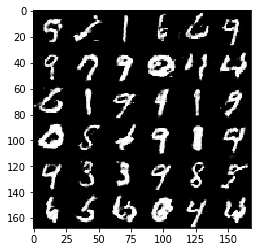

Epoch 1, step 1402 Discriminator Loss: 1.1783... Generator Loss: 0.6365
Epoch 1, step 1403 Discriminator Loss: 1.5290... Generator Loss: 0.4087
Epoch 1, step 1404 Discriminator Loss: 1.8511... Generator Loss: 0.2745
Epoch 1, step 1405 Discriminator Loss: 1.0106... Generator Loss: 0.7689
Epoch 1, step 1406 Discriminator Loss: 0.9543... Generator Loss: 1.0294
Epoch 1, step 1407 Discriminator Loss: 1.7210... Generator Loss: 0.3607
Epoch 1, step 1408 Discriminator Loss: 1.4592... Generator Loss: 0.4173
Epoch 1, step 1409 Discriminator Loss: 0.9955... Generator Loss: 0.7911
Epoch 1, step 1410 Discriminator Loss: 0.9073... Generator Loss: 0.9245
Epoch 1, step 1411 Discriminator Loss: 1.3311... Generator Loss: 0.5159
Epoch 1, step 1412 Discriminator Loss: 1.4167... Generator Loss: 0.4964
Epoch 1, step 1413 Discriminator Loss: 0.8646... Generator Loss: 1.0236
Epoch 1, step 1414 Discriminator Loss: 1.0719... Generator Loss: 0.7117
Epoch 1, step 1415 Discriminator Loss: 1.1706... Generator Loss:

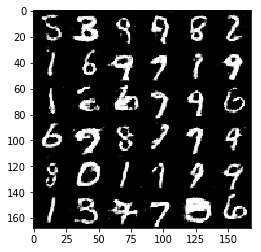

Epoch 1, step 1502 Discriminator Loss: 1.5269... Generator Loss: 0.3949
Epoch 1, step 1503 Discriminator Loss: 0.7861... Generator Loss: 1.1709
Epoch 1, step 1504 Discriminator Loss: 1.0180... Generator Loss: 0.7821
Epoch 1, step 1505 Discriminator Loss: 1.1413... Generator Loss: 0.6560
Epoch 1, step 1506 Discriminator Loss: 1.1122... Generator Loss: 0.6995
Epoch 1, step 1507 Discriminator Loss: 1.6050... Generator Loss: 0.3903
Epoch 1, step 1508 Discriminator Loss: 1.0957... Generator Loss: 0.7518
Epoch 1, step 1509 Discriminator Loss: 1.6401... Generator Loss: 0.3894
Epoch 1, step 1510 Discriminator Loss: 1.2992... Generator Loss: 0.5410
Epoch 1, step 1511 Discriminator Loss: 1.1035... Generator Loss: 0.7154
Epoch 1, step 1512 Discriminator Loss: 1.3898... Generator Loss: 0.4981
Epoch 1, step 1513 Discriminator Loss: 1.0492... Generator Loss: 0.7997
Epoch 1, step 1514 Discriminator Loss: 1.6144... Generator Loss: 0.3623
Epoch 1, step 1515 Discriminator Loss: 1.0571... Generator Loss:

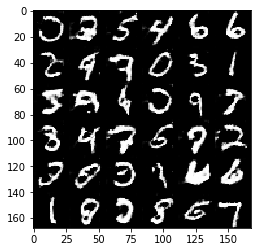

Epoch 1, step 1602 Discriminator Loss: 1.5926... Generator Loss: 0.3954
Epoch 1, step 1603 Discriminator Loss: 1.4944... Generator Loss: 0.4635
Epoch 1, step 1604 Discriminator Loss: 0.7746... Generator Loss: 1.5846
Epoch 1, step 1605 Discriminator Loss: 1.4369... Generator Loss: 0.5656
Epoch 1, step 1606 Discriminator Loss: 1.8654... Generator Loss: 0.2956
Epoch 1, step 1607 Discriminator Loss: 1.4123... Generator Loss: 0.4970
Epoch 1, step 1608 Discriminator Loss: 2.0943... Generator Loss: 0.2074
Epoch 1, step 1609 Discriminator Loss: 1.0413... Generator Loss: 0.7989
Epoch 1, step 1610 Discriminator Loss: 1.4415... Generator Loss: 0.4577
Epoch 1, step 1611 Discriminator Loss: 1.6980... Generator Loss: 0.3273
Epoch 1, step 1612 Discriminator Loss: 1.6613... Generator Loss: 0.3496
Epoch 1, step 1613 Discriminator Loss: 1.6521... Generator Loss: 0.3553
Epoch 1, step 1614 Discriminator Loss: 1.4248... Generator Loss: 0.4561
Epoch 1, step 1615 Discriminator Loss: 0.8625... Generator Loss:

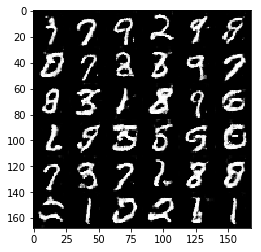

Epoch 1, step 1702 Discriminator Loss: 1.2481... Generator Loss: 0.6572
Epoch 1, step 1703 Discriminator Loss: 1.1929... Generator Loss: 1.3002
Epoch 1, step 1704 Discriminator Loss: 3.1873... Generator Loss: 0.1148
Epoch 1, step 1705 Discriminator Loss: 1.3137... Generator Loss: 3.5992
Epoch 1, step 1706 Discriminator Loss: 2.5887... Generator Loss: 0.2121
Epoch 1, step 1707 Discriminator Loss: 1.0583... Generator Loss: 1.0666
Epoch 1, step 1708 Discriminator Loss: 0.8772... Generator Loss: 2.0323
Epoch 1, step 1709 Discriminator Loss: 1.0893... Generator Loss: 0.8159
Epoch 1, step 1710 Discriminator Loss: 1.3504... Generator Loss: 0.5328
Epoch 1, step 1711 Discriminator Loss: 0.9833... Generator Loss: 0.8963
Epoch 1, step 1712 Discriminator Loss: 0.8023... Generator Loss: 1.2126
Epoch 1, step 1713 Discriminator Loss: 0.8144... Generator Loss: 1.0674
Epoch 1, step 1714 Discriminator Loss: 1.2098... Generator Loss: 0.6018
Epoch 1, step 1715 Discriminator Loss: 0.9198... Generator Loss:

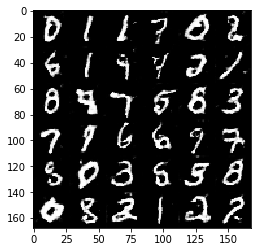

Epoch 1, step 1802 Discriminator Loss: 1.2973... Generator Loss: 0.5660
Epoch 1, step 1803 Discriminator Loss: 1.1918... Generator Loss: 0.6335
Epoch 1, step 1804 Discriminator Loss: 1.1098... Generator Loss: 0.7045
Epoch 1, step 1805 Discriminator Loss: 1.7074... Generator Loss: 0.3355
Epoch 1, step 1806 Discriminator Loss: 1.1862... Generator Loss: 0.6514
Epoch 1, step 1807 Discriminator Loss: 1.1320... Generator Loss: 0.6652
Epoch 1, step 1808 Discriminator Loss: 1.7703... Generator Loss: 0.3190
Epoch 1, step 1809 Discriminator Loss: 1.0901... Generator Loss: 0.7121
Epoch 1, step 1810 Discriminator Loss: 1.5236... Generator Loss: 0.4379
Epoch 1, step 1811 Discriminator Loss: 1.1663... Generator Loss: 0.6472
Epoch 1, step 1812 Discriminator Loss: 0.7853... Generator Loss: 1.3518
Epoch 1, step 1813 Discriminator Loss: 1.5935... Generator Loss: 0.4303
Epoch 1, step 1814 Discriminator Loss: 1.6053... Generator Loss: 0.3662
Epoch 1, step 1815 Discriminator Loss: 1.3183... Generator Loss:

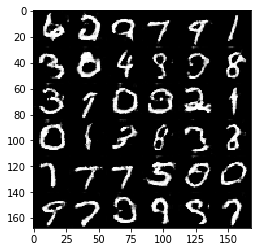

Epoch 2, step 1902 Discriminator Loss: 1.6573... Generator Loss: 0.3565
Epoch 2, step 1903 Discriminator Loss: 1.2855... Generator Loss: 0.5407
Epoch 2, step 1904 Discriminator Loss: 0.7684... Generator Loss: 1.2072
Epoch 2, step 1905 Discriminator Loss: 1.2122... Generator Loss: 0.5783
Epoch 2, step 1906 Discriminator Loss: 1.7039... Generator Loss: 0.3452
Epoch 2, step 1907 Discriminator Loss: 1.2025... Generator Loss: 0.6050
Epoch 2, step 1908 Discriminator Loss: 1.1958... Generator Loss: 0.6223
Epoch 2, step 1909 Discriminator Loss: 0.8796... Generator Loss: 0.9181
Epoch 2, step 1910 Discriminator Loss: 0.9366... Generator Loss: 1.3767
Epoch 2, step 1911 Discriminator Loss: 1.3412... Generator Loss: 0.5745
Epoch 2, step 1912 Discriminator Loss: 1.8416... Generator Loss: 0.3069
Epoch 2, step 1913 Discriminator Loss: 0.6944... Generator Loss: 1.7893
Epoch 2, step 1914 Discriminator Loss: 0.5005... Generator Loss: 2.3099
Epoch 2, step 1915 Discriminator Loss: 1.1085... Generator Loss:

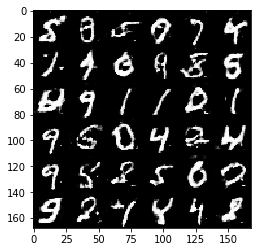

Epoch 2, step 2002 Discriminator Loss: 1.1121... Generator Loss: 0.6877
Epoch 2, step 2003 Discriminator Loss: 1.1196... Generator Loss: 0.6999
Epoch 2, step 2004 Discriminator Loss: 0.8775... Generator Loss: 0.9726
Epoch 2, step 2005 Discriminator Loss: 1.8702... Generator Loss: 0.2980
Epoch 2, step 2006 Discriminator Loss: 1.9755... Generator Loss: 0.2677
Epoch 2, step 2007 Discriminator Loss: 1.1814... Generator Loss: 0.7093
Epoch 2, step 2008 Discriminator Loss: 1.5351... Generator Loss: 0.4128
Epoch 2, step 2009 Discriminator Loss: 1.3682... Generator Loss: 0.4921
Epoch 2, step 2010 Discriminator Loss: 0.8548... Generator Loss: 1.1341
Epoch 2, step 2011 Discriminator Loss: 1.5579... Generator Loss: 0.4420
Epoch 2, step 2012 Discriminator Loss: 2.2525... Generator Loss: 0.1843
Epoch 2, step 2013 Discriminator Loss: 1.2211... Generator Loss: 0.5851
Epoch 2, step 2014 Discriminator Loss: 1.0914... Generator Loss: 0.7204
Epoch 2, step 2015 Discriminator Loss: 1.5472... Generator Loss:

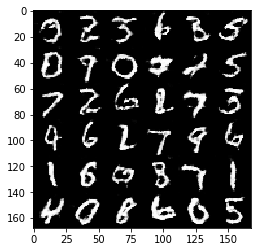

Epoch 2, step 2102 Discriminator Loss: 2.3166... Generator Loss: 0.2064
Epoch 2, step 2103 Discriminator Loss: 1.0333... Generator Loss: 0.7987
Epoch 2, step 2104 Discriminator Loss: 0.8561... Generator Loss: 1.2861
Epoch 2, step 2105 Discriminator Loss: 1.6494... Generator Loss: 0.3830
Epoch 2, step 2106 Discriminator Loss: 1.5875... Generator Loss: 0.3864
Epoch 2, step 2107 Discriminator Loss: 0.9880... Generator Loss: 0.8287
Epoch 2, step 2108 Discriminator Loss: 1.5302... Generator Loss: 0.4019
Epoch 2, step 2109 Discriminator Loss: 1.8650... Generator Loss: 0.2812
Epoch 2, step 2110 Discriminator Loss: 0.7970... Generator Loss: 1.3445
Epoch 2, step 2111 Discriminator Loss: 2.2498... Generator Loss: 0.2100
Epoch 2, step 2112 Discriminator Loss: 0.8128... Generator Loss: 1.0864
Epoch 2, step 2113 Discriminator Loss: 1.1851... Generator Loss: 0.6213
Epoch 2, step 2114 Discriminator Loss: 1.0974... Generator Loss: 0.6976
Epoch 2, step 2115 Discriminator Loss: 1.4693... Generator Loss:

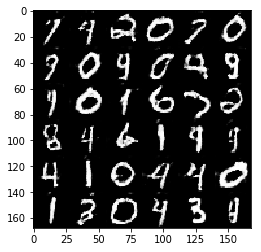

Epoch 2, step 2202 Discriminator Loss: 0.8301... Generator Loss: 1.0990
Epoch 2, step 2203 Discriminator Loss: 1.2976... Generator Loss: 0.5906
Epoch 2, step 2204 Discriminator Loss: 1.0213... Generator Loss: 0.7942
Epoch 2, step 2205 Discriminator Loss: 1.4382... Generator Loss: 0.4546
Epoch 2, step 2206 Discriminator Loss: 1.3823... Generator Loss: 0.5330
Epoch 2, step 2207 Discriminator Loss: 1.7783... Generator Loss: 0.3075
Epoch 2, step 2208 Discriminator Loss: 1.0901... Generator Loss: 0.7241
Epoch 2, step 2209 Discriminator Loss: 1.4711... Generator Loss: 0.4624
Epoch 2, step 2210 Discriminator Loss: 1.3255... Generator Loss: 0.5246
Epoch 2, step 2211 Discriminator Loss: 0.8126... Generator Loss: 1.1164
Epoch 2, step 2212 Discriminator Loss: 0.7940... Generator Loss: 1.1809
Epoch 2, step 2213 Discriminator Loss: 0.8279... Generator Loss: 1.1430
Epoch 2, step 2214 Discriminator Loss: 0.8075... Generator Loss: 1.1098
Epoch 2, step 2215 Discriminator Loss: 1.9662... Generator Loss:

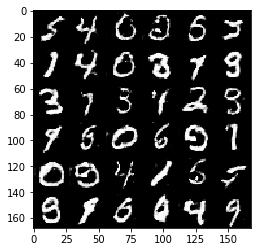

Epoch 2, step 2302 Discriminator Loss: 0.9671... Generator Loss: 0.8676
Epoch 2, step 2303 Discriminator Loss: 1.0000... Generator Loss: 0.8090
Epoch 2, step 2304 Discriminator Loss: 1.6261... Generator Loss: 0.3486
Epoch 2, step 2305 Discriminator Loss: 0.7248... Generator Loss: 2.5224
Epoch 2, step 2306 Discriminator Loss: 0.7367... Generator Loss: 1.3750
Epoch 2, step 2307 Discriminator Loss: 1.3152... Generator Loss: 0.5748
Epoch 2, step 2308 Discriminator Loss: 1.1587... Generator Loss: 0.6690
Epoch 2, step 2309 Discriminator Loss: 0.8538... Generator Loss: 0.9807
Epoch 2, step 2310 Discriminator Loss: 2.0976... Generator Loss: 0.2147
Epoch 2, step 2311 Discriminator Loss: 1.5370... Generator Loss: 0.3905
Epoch 2, step 2312 Discriminator Loss: 1.3725... Generator Loss: 0.4776
Epoch 2, step 2313 Discriminator Loss: 1.2556... Generator Loss: 0.5777
Epoch 2, step 2314 Discriminator Loss: 0.9615... Generator Loss: 0.8718
Epoch 2, step 2315 Discriminator Loss: 1.4919... Generator Loss:

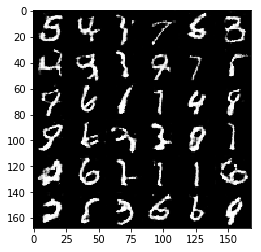

Epoch 2, step 2402 Discriminator Loss: 1.0847... Generator Loss: 0.7423
Epoch 2, step 2403 Discriminator Loss: 1.5627... Generator Loss: 0.4057
Epoch 2, step 2404 Discriminator Loss: 1.2006... Generator Loss: 0.5951
Epoch 2, step 2405 Discriminator Loss: 1.0127... Generator Loss: 0.7924
Epoch 2, step 2406 Discriminator Loss: 1.3590... Generator Loss: 0.4870
Epoch 2, step 2407 Discriminator Loss: 1.1927... Generator Loss: 0.6047
Epoch 2, step 2408 Discriminator Loss: 1.8435... Generator Loss: 0.2988
Epoch 2, step 2409 Discriminator Loss: 1.0654... Generator Loss: 0.7597
Epoch 2, step 2410 Discriminator Loss: 0.8420... Generator Loss: 1.1036
Epoch 2, step 2411 Discriminator Loss: 1.0132... Generator Loss: 0.8143
Epoch 2, step 2412 Discriminator Loss: 2.0209... Generator Loss: 0.2597
Epoch 2, step 2413 Discriminator Loss: 1.7510... Generator Loss: 0.3134
Epoch 2, step 2414 Discriminator Loss: 0.9209... Generator Loss: 0.9058
Epoch 2, step 2415 Discriminator Loss: 0.6110... Generator Loss:

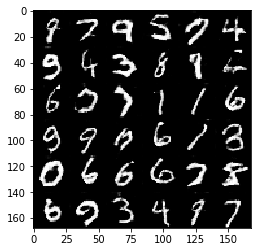

Epoch 2, step 2502 Discriminator Loss: 1.2010... Generator Loss: 0.6158
Epoch 2, step 2503 Discriminator Loss: 1.0306... Generator Loss: 2.6807
Epoch 2, step 2504 Discriminator Loss: 0.5612... Generator Loss: 1.7964
Epoch 2, step 2505 Discriminator Loss: 1.5787... Generator Loss: 0.4747
Epoch 2, step 2506 Discriminator Loss: 1.3277... Generator Loss: 0.5468
Epoch 2, step 2507 Discriminator Loss: 0.7807... Generator Loss: 1.1183
Epoch 2, step 2508 Discriminator Loss: 0.9213... Generator Loss: 0.8810
Epoch 2, step 2509 Discriminator Loss: 1.0157... Generator Loss: 0.8024
Epoch 2, step 2510 Discriminator Loss: 1.3379... Generator Loss: 0.5294
Epoch 2, step 2511 Discriminator Loss: 1.3808... Generator Loss: 0.4858
Epoch 2, step 2512 Discriminator Loss: 0.8380... Generator Loss: 1.1886
Epoch 2, step 2513 Discriminator Loss: 0.6142... Generator Loss: 1.9789
Epoch 2, step 2514 Discriminator Loss: 1.5723... Generator Loss: 0.5014
Epoch 2, step 2515 Discriminator Loss: 0.9584... Generator Loss:

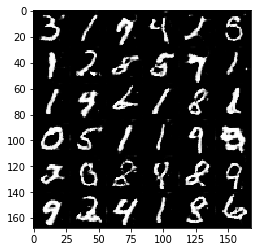

Epoch 2, step 2602 Discriminator Loss: 1.0862... Generator Loss: 0.7620
Epoch 2, step 2603 Discriminator Loss: 1.1898... Generator Loss: 0.5951
Epoch 2, step 2604 Discriminator Loss: 1.4320... Generator Loss: 0.4713
Epoch 2, step 2605 Discriminator Loss: 1.1062... Generator Loss: 0.6803
Epoch 2, step 2606 Discriminator Loss: 0.7701... Generator Loss: 1.2074
Epoch 2, step 2607 Discriminator Loss: 1.0827... Generator Loss: 0.8031
Epoch 2, step 2608 Discriminator Loss: 1.3161... Generator Loss: 0.5305
Epoch 2, step 2609 Discriminator Loss: 2.2148... Generator Loss: 0.2053
Epoch 2, step 2610 Discriminator Loss: 1.1485... Generator Loss: 0.7208
Epoch 2, step 2611 Discriminator Loss: 1.0827... Generator Loss: 0.7760
Epoch 2, step 2612 Discriminator Loss: 0.9814... Generator Loss: 0.8257
Epoch 2, step 2613 Discriminator Loss: 0.9578... Generator Loss: 0.8963
Epoch 2, step 2614 Discriminator Loss: 1.8914... Generator Loss: 0.2940
Epoch 2, step 2615 Discriminator Loss: 1.2280... Generator Loss:

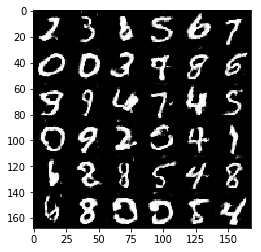

Epoch 2, step 2702 Discriminator Loss: 1.3120... Generator Loss: 0.5394
Epoch 2, step 2703 Discriminator Loss: 1.5391... Generator Loss: 0.3974
Epoch 2, step 2704 Discriminator Loss: 1.1699... Generator Loss: 0.6283
Epoch 2, step 2705 Discriminator Loss: 0.9482... Generator Loss: 0.9143
Epoch 2, step 2706 Discriminator Loss: 1.0450... Generator Loss: 0.7363
Epoch 2, step 2707 Discriminator Loss: 1.1133... Generator Loss: 0.7002
Epoch 2, step 2708 Discriminator Loss: 1.3688... Generator Loss: 0.5124
Epoch 2, step 2709 Discriminator Loss: 1.3888... Generator Loss: 0.4801
Epoch 2, step 2710 Discriminator Loss: 1.0523... Generator Loss: 0.7771
Epoch 2, step 2711 Discriminator Loss: 0.8416... Generator Loss: 1.0291
Epoch 2, step 2712 Discriminator Loss: 1.4572... Generator Loss: 0.4510
Epoch 2, step 2713 Discriminator Loss: 2.6955... Generator Loss: 0.1252
Epoch 2, step 2714 Discriminator Loss: 0.7588... Generator Loss: 3.9013
Epoch 2, step 2715 Discriminator Loss: 0.8154... Generator Loss:

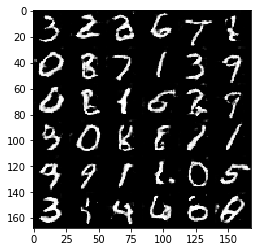

Epoch 2, step 2802 Discriminator Loss: 0.9114... Generator Loss: 1.0985
Epoch 2, step 2803 Discriminator Loss: 0.7670... Generator Loss: 1.2608
Epoch 2, step 2804 Discriminator Loss: 1.0194... Generator Loss: 0.8094
Epoch 2, step 2805 Discriminator Loss: 1.6953... Generator Loss: 0.3497
Epoch 2, step 2806 Discriminator Loss: 0.9274... Generator Loss: 0.8979
Epoch 2, step 2807 Discriminator Loss: 1.2235... Generator Loss: 0.5838
Epoch 2, step 2808 Discriminator Loss: 1.4635... Generator Loss: 0.4824
Epoch 2, step 2809 Discriminator Loss: 1.5370... Generator Loss: 0.4069
Epoch 2, step 2810 Discriminator Loss: 1.2344... Generator Loss: 0.5689
Epoch 2, step 2811 Discriminator Loss: 0.6277... Generator Loss: 1.5696
Epoch 2, step 2812 Discriminator Loss: 2.1371... Generator Loss: 0.2543
Epoch 2, step 2813 Discriminator Loss: 1.4775... Generator Loss: 0.4263
Epoch 2, step 2814 Discriminator Loss: 1.2805... Generator Loss: 0.5888
Epoch 2, step 2815 Discriminator Loss: 0.9506... Generator Loss:

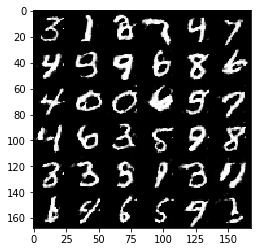

Epoch 2, step 2902 Discriminator Loss: 1.2574... Generator Loss: 0.5793
Epoch 2, step 2903 Discriminator Loss: 1.5571... Generator Loss: 0.4032
Epoch 2, step 2904 Discriminator Loss: 2.0175... Generator Loss: 0.2596
Epoch 2, step 2905 Discriminator Loss: 1.1770... Generator Loss: 0.6345
Epoch 2, step 2906 Discriminator Loss: 1.4577... Generator Loss: 0.4914
Epoch 2, step 2907 Discriminator Loss: 0.9741... Generator Loss: 0.8838
Epoch 2, step 2908 Discriminator Loss: 1.1164... Generator Loss: 0.6810
Epoch 2, step 2909 Discriminator Loss: 2.0871... Generator Loss: 0.2313
Epoch 2, step 2910 Discriminator Loss: 1.5568... Generator Loss: 0.3686
Epoch 2, step 2911 Discriminator Loss: 1.8409... Generator Loss: 0.2900
Epoch 2, step 2912 Discriminator Loss: 1.5265... Generator Loss: 0.4785
Epoch 2, step 2913 Discriminator Loss: 0.8874... Generator Loss: 0.9898
Epoch 2, step 2914 Discriminator Loss: 1.0425... Generator Loss: 0.7832
Epoch 2, step 2915 Discriminator Loss: 1.4361... Generator Loss:

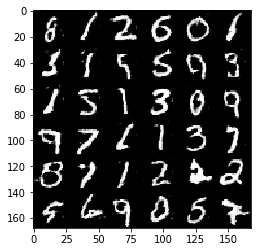

Epoch 2, step 3002 Discriminator Loss: 0.8694... Generator Loss: 0.9563
Epoch 2, step 3003 Discriminator Loss: 1.3420... Generator Loss: 0.5317
Epoch 2, step 3004 Discriminator Loss: 0.7578... Generator Loss: 1.1597
Epoch 2, step 3005 Discriminator Loss: 1.1834... Generator Loss: 0.5787
Epoch 2, step 3006 Discriminator Loss: 0.8923... Generator Loss: 1.0600
Epoch 2, step 3007 Discriminator Loss: 0.8501... Generator Loss: 1.0086
Epoch 2, step 3008 Discriminator Loss: 1.8745... Generator Loss: 0.3535
Epoch 2, step 3009 Discriminator Loss: 0.8539... Generator Loss: 0.9762
Epoch 2, step 3010 Discriminator Loss: 0.6389... Generator Loss: 1.5324
Epoch 2, step 3011 Discriminator Loss: 0.6296... Generator Loss: 1.6789
Epoch 2, step 3012 Discriminator Loss: 1.1992... Generator Loss: 0.6801
Epoch 2, step 3013 Discriminator Loss: 0.7983... Generator Loss: 1.0624
Epoch 2, step 3014 Discriminator Loss: 0.6500... Generator Loss: 1.4061
Epoch 2, step 3015 Discriminator Loss: 0.6280... Generator Loss:

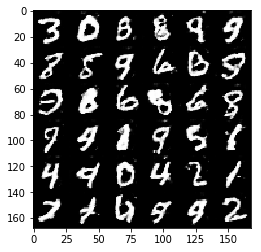

Epoch 2, step 3102 Discriminator Loss: 0.6456... Generator Loss: 1.4908
Epoch 2, step 3103 Discriminator Loss: 0.4479... Generator Loss: 2.4099
Epoch 2, step 3104 Discriminator Loss: 1.2886... Generator Loss: 0.5886
Epoch 2, step 3105 Discriminator Loss: 2.6686... Generator Loss: 0.1336
Epoch 2, step 3106 Discriminator Loss: 1.0425... Generator Loss: 0.7835
Epoch 2, step 3107 Discriminator Loss: 0.6114... Generator Loss: 2.5640
Epoch 2, step 3108 Discriminator Loss: 1.0091... Generator Loss: 0.9029
Epoch 2, step 3109 Discriminator Loss: 0.8081... Generator Loss: 1.1725
Epoch 2, step 3110 Discriminator Loss: 0.9763... Generator Loss: 0.8526
Epoch 2, step 3111 Discriminator Loss: 1.1703... Generator Loss: 0.6557
Epoch 2, step 3112 Discriminator Loss: 1.2720... Generator Loss: 0.5416
Epoch 2, step 3113 Discriminator Loss: 0.6728... Generator Loss: 1.3870
Epoch 2, step 3114 Discriminator Loss: 0.9575... Generator Loss: 0.9186
Epoch 2, step 3115 Discriminator Loss: 0.8653... Generator Loss:

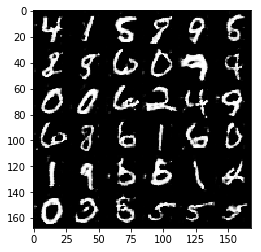

Epoch 2, step 3202 Discriminator Loss: 1.2418... Generator Loss: 0.5779
Epoch 2, step 3203 Discriminator Loss: 0.9214... Generator Loss: 0.9513
Epoch 2, step 3204 Discriminator Loss: 0.8643... Generator Loss: 0.9985
Epoch 2, step 3205 Discriminator Loss: 2.2096... Generator Loss: 0.2298
Epoch 2, step 3206 Discriminator Loss: 1.5713... Generator Loss: 0.3864
Epoch 2, step 3207 Discriminator Loss: 1.2190... Generator Loss: 2.4085
Epoch 2, step 3208 Discriminator Loss: 1.8204... Generator Loss: 0.3589
Epoch 2, step 3209 Discriminator Loss: 1.2185... Generator Loss: 0.6359
Epoch 2, step 3210 Discriminator Loss: 0.9349... Generator Loss: 0.8700
Epoch 2, step 3211 Discriminator Loss: 0.5827... Generator Loss: 1.6449
Epoch 2, step 3212 Discriminator Loss: 1.1817... Generator Loss: 0.6171
Epoch 2, step 3213 Discriminator Loss: 0.9318... Generator Loss: 0.9002
Epoch 2, step 3214 Discriminator Loss: 0.6451... Generator Loss: 1.4492
Epoch 2, step 3215 Discriminator Loss: 2.1847... Generator Loss:

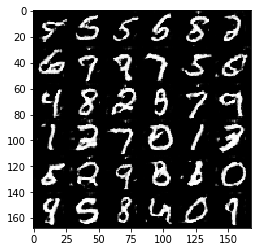

Epoch 2, step 3302 Discriminator Loss: 1.2408... Generator Loss: 0.6126
Epoch 2, step 3303 Discriminator Loss: 1.2748... Generator Loss: 0.5547
Epoch 2, step 3304 Discriminator Loss: 1.2661... Generator Loss: 0.5442
Epoch 2, step 3305 Discriminator Loss: 1.2390... Generator Loss: 0.5792
Epoch 2, step 3306 Discriminator Loss: 1.7432... Generator Loss: 0.3386
Epoch 2, step 3307 Discriminator Loss: 1.2637... Generator Loss: 0.5827
Epoch 2, step 3308 Discriminator Loss: 1.8449... Generator Loss: 0.3101
Epoch 2, step 3309 Discriminator Loss: 1.7674... Generator Loss: 0.3240
Epoch 2, step 3310 Discriminator Loss: 0.9860... Generator Loss: 0.8720
Epoch 2, step 3311 Discriminator Loss: 1.4928... Generator Loss: 0.4495
Epoch 2, step 3312 Discriminator Loss: 1.4901... Generator Loss: 0.4305
Epoch 2, step 3313 Discriminator Loss: 1.1228... Generator Loss: 0.6590
Epoch 2, step 3314 Discriminator Loss: 1.1390... Generator Loss: 0.6875
Epoch 2, step 3315 Discriminator Loss: 3.4714... Generator Loss:

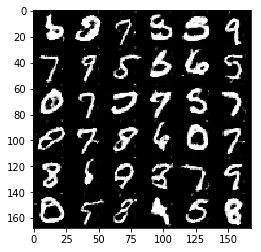

Epoch 2, step 3402 Discriminator Loss: 2.5553... Generator Loss: 0.1619
Epoch 2, step 3403 Discriminator Loss: 1.4217... Generator Loss: 0.4743
Epoch 2, step 3404 Discriminator Loss: 1.4320... Generator Loss: 2.6417
Epoch 2, step 3405 Discriminator Loss: 1.2826... Generator Loss: 0.7207
Epoch 2, step 3406 Discriminator Loss: 0.8866... Generator Loss: 1.0029
Epoch 2, step 3407 Discriminator Loss: 0.6282... Generator Loss: 1.8761
Epoch 2, step 3408 Discriminator Loss: 2.9412... Generator Loss: 0.1341
Epoch 2, step 3409 Discriminator Loss: 0.4802... Generator Loss: 3.4408
Epoch 2, step 3410 Discriminator Loss: 0.7233... Generator Loss: 3.8298
Epoch 2, step 3411 Discriminator Loss: 2.9306... Generator Loss: 0.1667
Epoch 2, step 3412 Discriminator Loss: 0.5092... Generator Loss: 2.2850
Epoch 2, step 3413 Discriminator Loss: 1.0202... Generator Loss: 2.9271
Epoch 2, step 3414 Discriminator Loss: 0.9964... Generator Loss: 0.8088
Epoch 2, step 3415 Discriminator Loss: 0.7334... Generator Loss:

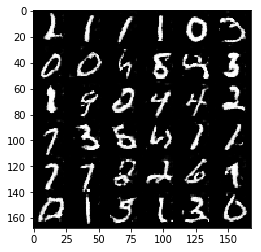

Epoch 2, step 3502 Discriminator Loss: 1.1409... Generator Loss: 0.6651
Epoch 2, step 3503 Discriminator Loss: 1.4667... Generator Loss: 0.4357
Epoch 2, step 3504 Discriminator Loss: 1.5062... Generator Loss: 0.3973
Epoch 2, step 3505 Discriminator Loss: 1.2986... Generator Loss: 0.5329
Epoch 2, step 3506 Discriminator Loss: 0.9607... Generator Loss: 0.8264
Epoch 2, step 3507 Discriminator Loss: 0.6042... Generator Loss: 1.5249
Epoch 2, step 3508 Discriminator Loss: 0.6664... Generator Loss: 1.3857
Epoch 2, step 3509 Discriminator Loss: 1.3505... Generator Loss: 0.5095
Epoch 2, step 3510 Discriminator Loss: 1.4821... Generator Loss: 0.4497
Epoch 2, step 3511 Discriminator Loss: 1.1274... Generator Loss: 0.6795
Epoch 2, step 3512 Discriminator Loss: 0.9457... Generator Loss: 0.8689
Epoch 2, step 3513 Discriminator Loss: 0.7468... Generator Loss: 1.2549
Epoch 2, step 3514 Discriminator Loss: 0.9337... Generator Loss: 0.9191
Epoch 2, step 3515 Discriminator Loss: 0.9816... Generator Loss:

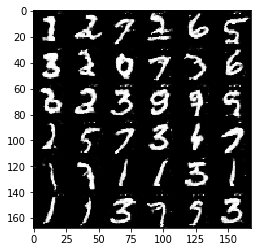

Epoch 2, step 3602 Discriminator Loss: 1.3876... Generator Loss: 0.4541
Epoch 2, step 3603 Discriminator Loss: 0.7299... Generator Loss: 1.2809
Epoch 2, step 3604 Discriminator Loss: 1.4581... Generator Loss: 0.4347
Epoch 2, step 3605 Discriminator Loss: 0.8327... Generator Loss: 1.0257
Epoch 2, step 3606 Discriminator Loss: 0.9866... Generator Loss: 0.8258
Epoch 2, step 3607 Discriminator Loss: 1.0905... Generator Loss: 0.7219
Epoch 2, step 3608 Discriminator Loss: 1.6655... Generator Loss: 0.3764
Epoch 2, step 3609 Discriminator Loss: 1.3745... Generator Loss: 0.5033
Epoch 2, step 3610 Discriminator Loss: 0.9450... Generator Loss: 0.8848
Epoch 2, step 3611 Discriminator Loss: 1.2016... Generator Loss: 0.5884
Epoch 2, step 3612 Discriminator Loss: 0.5706... Generator Loss: 1.7105
Epoch 2, step 3613 Discriminator Loss: 2.1054... Generator Loss: 0.2391
Epoch 2, step 3614 Discriminator Loss: 0.5354... Generator Loss: 2.3935
Epoch 2, step 3615 Discriminator Loss: 0.4456... Generator Loss:

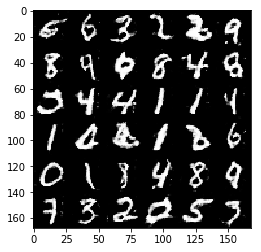

Epoch 2, step 3702 Discriminator Loss: 1.1649... Generator Loss: 0.6446
Epoch 2, step 3703 Discriminator Loss: 0.6622... Generator Loss: 1.7226
Epoch 2, step 3704 Discriminator Loss: 0.5237... Generator Loss: 1.9349
Epoch 2, step 3705 Discriminator Loss: 2.4515... Generator Loss: 0.2026
Epoch 2, step 3706 Discriminator Loss: 0.8917... Generator Loss: 0.9497
Epoch 2, step 3707 Discriminator Loss: 0.9859... Generator Loss: 2.5694
Epoch 2, step 3708 Discriminator Loss: 0.5325... Generator Loss: 1.9807
Epoch 2, step 3709 Discriminator Loss: 1.2021... Generator Loss: 0.6140
Epoch 2, step 3710 Discriminator Loss: 1.3886... Generator Loss: 0.4838
Epoch 2, step 3711 Discriminator Loss: 0.8279... Generator Loss: 1.0367
Epoch 2, step 3712 Discriminator Loss: 1.0817... Generator Loss: 0.7333
Epoch 2, step 3713 Discriminator Loss: 0.8587... Generator Loss: 0.9658
Epoch 2, step 3714 Discriminator Loss: 0.7724... Generator Loss: 1.1380
Epoch 2, step 3715 Discriminator Loss: 1.1690... Generator Loss:

In [ ]:
batch_size = 32
z_dim = 64
learning_rate = 0.0002
beta1 = 0.5
keep_prob=0.8

# I modified below in order to add the parameter keep_prob and different learning rates for sgd and adam
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, keep_prob, beta1,
          mnist_dataset.get_batches, mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1, step 1 Discriminator Loss: 1.6469... Generator Loss: 1.0151


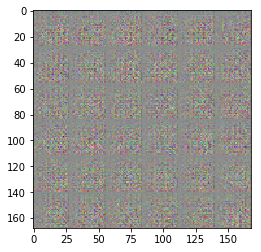

Epoch 1, step 2 Discriminator Loss: 5.4165... Generator Loss: 0.0123
Epoch 1, step 3 Discriminator Loss: 4.3270... Generator Loss: 0.0300
Epoch 1, step 4 Discriminator Loss: 2.9523... Generator Loss: 0.1190
Epoch 1, step 5 Discriminator Loss: 3.0571... Generator Loss: 0.0888
Epoch 1, step 6 Discriminator Loss: 3.5454... Generator Loss: 0.0464
Epoch 1, step 7 Discriminator Loss: 3.0934... Generator Loss: 0.0730
Epoch 1, step 8 Discriminator Loss: 2.3099... Generator Loss: 0.1682
Epoch 1, step 9 Discriminator Loss: 3.1077... Generator Loss: 0.0734
Epoch 1, step 10 Discriminator Loss: 3.1803... Generator Loss: 0.0644
Epoch 1, step 11 Discriminator Loss: 2.1053... Generator Loss: 0.2444
Epoch 1, step 12 Discriminator Loss: 3.8250... Generator Loss: 0.0381
Epoch 1, step 13 Discriminator Loss: 1.4528... Generator Loss: 0.5923
Epoch 1, step 14 Discriminator Loss: 3.4266... Generator Loss: 0.0563
Epoch 1, step 15 Discriminator Loss: 2.3729... Generator Loss: 0.1679
Epoch 1, step 16 Discriminat

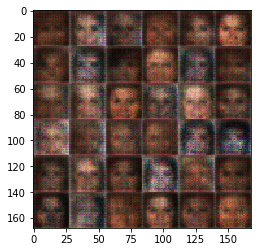

Epoch 1, step 102 Discriminator Loss: 1.3191... Generator Loss: 0.7699
Epoch 1, step 103 Discriminator Loss: 1.8862... Generator Loss: 0.2750
Epoch 1, step 104 Discriminator Loss: 2.2774... Generator Loss: 0.1816
Epoch 1, step 105 Discriminator Loss: 1.6575... Generator Loss: 0.9621
Epoch 1, step 106 Discriminator Loss: 1.6710... Generator Loss: 0.3741
Epoch 1, step 107 Discriminator Loss: 1.8643... Generator Loss: 0.3044
Epoch 1, step 108 Discriminator Loss: 1.6992... Generator Loss: 0.3731
Epoch 1, step 109 Discriminator Loss: 1.6184... Generator Loss: 0.4279
Epoch 1, step 110 Discriminator Loss: 2.0887... Generator Loss: 0.2277
Epoch 1, step 111 Discriminator Loss: 1.7804... Generator Loss: 0.4897
Epoch 1, step 112 Discriminator Loss: 1.8029... Generator Loss: 0.5052
Epoch 1, step 113 Discriminator Loss: 1.7515... Generator Loss: 0.3921
Epoch 1, step 114 Discriminator Loss: 2.5861... Generator Loss: 0.1188
Epoch 1, step 115 Discriminator Loss: 1.7180... Generator Loss: 1.9601
Epoch 

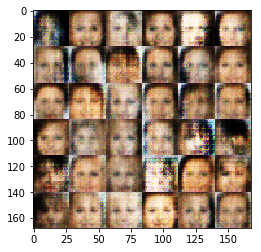

Epoch 1, step 202 Discriminator Loss: 1.2840... Generator Loss: 0.8128
Epoch 1, step 203 Discriminator Loss: 1.4745... Generator Loss: 0.4870
Epoch 1, step 204 Discriminator Loss: 1.3152... Generator Loss: 0.8451
Epoch 1, step 205 Discriminator Loss: 1.8569... Generator Loss: 0.2819
Epoch 1, step 206 Discriminator Loss: 1.3467... Generator Loss: 0.7270
Epoch 1, step 207 Discriminator Loss: 1.3032... Generator Loss: 0.7667
Epoch 1, step 208 Discriminator Loss: 1.6160... Generator Loss: 0.4004
Epoch 1, step 209 Discriminator Loss: 1.1745... Generator Loss: 0.9378
Epoch 1, step 210 Discriminator Loss: 1.7616... Generator Loss: 0.3109
Epoch 1, step 211 Discriminator Loss: 1.3257... Generator Loss: 0.9784
Epoch 1, step 212 Discriminator Loss: 1.7983... Generator Loss: 0.3205
Epoch 1, step 213 Discriminator Loss: 1.4179... Generator Loss: 0.5982
Epoch 1, step 214 Discriminator Loss: 1.7412... Generator Loss: 0.3507
Epoch 1, step 215 Discriminator Loss: 1.3299... Generator Loss: 0.7151
Epoch 

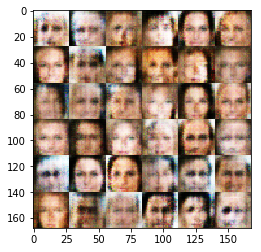

Epoch 1, step 302 Discriminator Loss: 1.4650... Generator Loss: 0.4807
Epoch 1, step 303 Discriminator Loss: 1.6256... Generator Loss: 0.3542
Epoch 1, step 304 Discriminator Loss: 1.2294... Generator Loss: 1.4296
Epoch 1, step 305 Discriminator Loss: 1.4948... Generator Loss: 0.4478
Epoch 1, step 306 Discriminator Loss: 1.4926... Generator Loss: 0.5641
Epoch 1, step 307 Discriminator Loss: 1.5275... Generator Loss: 0.5040
Epoch 1, step 308 Discriminator Loss: 1.5616... Generator Loss: 0.4350
Epoch 1, step 309 Discriminator Loss: 1.4134... Generator Loss: 0.7427
Epoch 1, step 310 Discriminator Loss: 1.4653... Generator Loss: 0.4639
Epoch 1, step 311 Discriminator Loss: 1.6093... Generator Loss: 0.4090
Epoch 1, step 312 Discriminator Loss: 1.4170... Generator Loss: 0.6200
Epoch 1, step 313 Discriminator Loss: 1.3906... Generator Loss: 0.5420
Epoch 1, step 314 Discriminator Loss: 1.4377... Generator Loss: 0.5974
Epoch 1, step 315 Discriminator Loss: 1.7000... Generator Loss: 0.3443
Epoch 

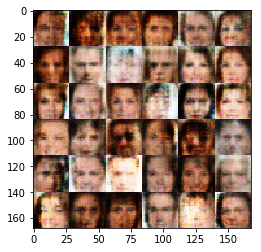

Epoch 1, step 402 Discriminator Loss: 1.3326... Generator Loss: 0.6030
Epoch 1, step 403 Discriminator Loss: 1.7782... Generator Loss: 0.3387
Epoch 1, step 404 Discriminator Loss: 1.5915... Generator Loss: 0.5156
Epoch 1, step 405 Discriminator Loss: 1.4808... Generator Loss: 0.5027
Epoch 1, step 406 Discriminator Loss: 1.6703... Generator Loss: 0.3747
Epoch 1, step 407 Discriminator Loss: 1.4666... Generator Loss: 0.5785
Epoch 1, step 408 Discriminator Loss: 1.2215... Generator Loss: 1.0519
Epoch 1, step 409 Discriminator Loss: 1.6232... Generator Loss: 0.3462
Epoch 1, step 410 Discriminator Loss: 1.3056... Generator Loss: 0.6996
Epoch 1, step 411 Discriminator Loss: 1.4141... Generator Loss: 0.6364
Epoch 1, step 412 Discriminator Loss: 1.8066... Generator Loss: 0.2882
Epoch 1, step 413 Discriminator Loss: 1.4563... Generator Loss: 1.2643
Epoch 1, step 414 Discriminator Loss: 1.8675... Generator Loss: 0.2821
Epoch 1, step 415 Discriminator Loss: 1.3671... Generator Loss: 0.8366
Epoch 

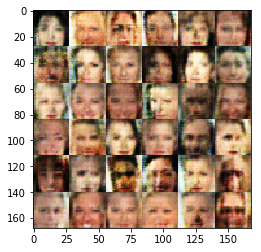

Epoch 1, step 502 Discriminator Loss: 1.2674... Generator Loss: 0.6095
Epoch 1, step 503 Discriminator Loss: 1.2311... Generator Loss: 0.6605
Epoch 1, step 504 Discriminator Loss: 1.4535... Generator Loss: 0.4929
Epoch 1, step 505 Discriminator Loss: 1.3483... Generator Loss: 0.6631
Epoch 1, step 506 Discriminator Loss: 1.4543... Generator Loss: 0.5316
Epoch 1, step 507 Discriminator Loss: 1.3025... Generator Loss: 0.8753
Epoch 1, step 508 Discriminator Loss: 1.6840... Generator Loss: 0.3708
Epoch 1, step 509 Discriminator Loss: 1.3500... Generator Loss: 0.6314
Epoch 1, step 510 Discriminator Loss: 1.4281... Generator Loss: 0.5925
Epoch 1, step 511 Discriminator Loss: 1.4451... Generator Loss: 0.4658
Epoch 1, step 512 Discriminator Loss: 1.5048... Generator Loss: 0.4602
Epoch 1, step 513 Discriminator Loss: 1.2258... Generator Loss: 0.9805
Epoch 1, step 514 Discriminator Loss: 1.6950... Generator Loss: 0.3301
Epoch 1, step 515 Discriminator Loss: 1.3746... Generator Loss: 0.8241
Epoch 

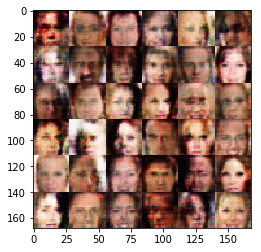

Epoch 1, step 602 Discriminator Loss: 1.4869... Generator Loss: 0.4749
Epoch 1, step 603 Discriminator Loss: 1.7043... Generator Loss: 0.3378
Epoch 1, step 604 Discriminator Loss: 1.4700... Generator Loss: 0.7355
Epoch 1, step 605 Discriminator Loss: 1.4580... Generator Loss: 0.4891
Epoch 1, step 606 Discriminator Loss: 1.5281... Generator Loss: 0.4455
Epoch 1, step 607 Discriminator Loss: 1.3247... Generator Loss: 0.6889
Epoch 1, step 608 Discriminator Loss: 1.4717... Generator Loss: 0.5181
Epoch 1, step 609 Discriminator Loss: 1.4190... Generator Loss: 0.5539
Epoch 1, step 610 Discriminator Loss: 1.3835... Generator Loss: 0.6316
Epoch 1, step 611 Discriminator Loss: 1.6050... Generator Loss: 0.4237
Epoch 1, step 612 Discriminator Loss: 1.3475... Generator Loss: 0.6102
Epoch 1, step 613 Discriminator Loss: 1.2998... Generator Loss: 0.6008
Epoch 1, step 614 Discriminator Loss: 1.3032... Generator Loss: 1.1666
Epoch 1, step 615 Discriminator Loss: 1.7472... Generator Loss: 0.3507
Epoch 

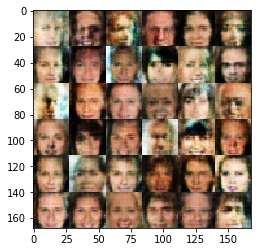

Epoch 1, step 702 Discriminator Loss: 1.1368... Generator Loss: 0.7791
Epoch 1, step 703 Discriminator Loss: 1.5193... Generator Loss: 0.5234
Epoch 1, step 704 Discriminator Loss: 1.4547... Generator Loss: 0.4994
Epoch 1, step 705 Discriminator Loss: 1.9359... Generator Loss: 0.2676
Epoch 1, step 706 Discriminator Loss: 1.6075... Generator Loss: 0.4277
Epoch 1, step 707 Discriminator Loss: 1.2212... Generator Loss: 0.7132
Epoch 1, step 708 Discriminator Loss: 1.5513... Generator Loss: 0.4636
Epoch 1, step 709 Discriminator Loss: 1.6505... Generator Loss: 0.4636
Epoch 1, step 710 Discriminator Loss: 1.5827... Generator Loss: 0.4211
Epoch 1, step 711 Discriminator Loss: 1.5831... Generator Loss: 0.4289
Epoch 1, step 712 Discriminator Loss: 1.3815... Generator Loss: 1.0933
Epoch 1, step 713 Discriminator Loss: 1.8994... Generator Loss: 0.2617
Epoch 1, step 714 Discriminator Loss: 1.2878... Generator Loss: 0.8524
Epoch 1, step 715 Discriminator Loss: 1.5367... Generator Loss: 0.5055
Epoch 

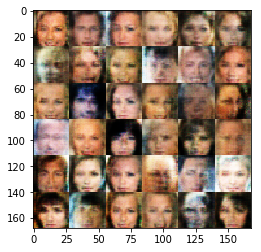

Epoch 1, step 802 Discriminator Loss: 1.3628... Generator Loss: 0.7288
Epoch 1, step 803 Discriminator Loss: 1.5236... Generator Loss: 0.5695
Epoch 1, step 804 Discriminator Loss: 1.5093... Generator Loss: 0.5067
Epoch 1, step 805 Discriminator Loss: 1.4749... Generator Loss: 0.6043
Epoch 1, step 806 Discriminator Loss: 1.4145... Generator Loss: 0.5961
Epoch 1, step 807 Discriminator Loss: 1.4381... Generator Loss: 0.5264
Epoch 1, step 808 Discriminator Loss: 1.3960... Generator Loss: 0.5780
Epoch 1, step 809 Discriminator Loss: 1.3396... Generator Loss: 0.6102
Epoch 1, step 810 Discriminator Loss: 1.3244... Generator Loss: 0.6319
Epoch 1, step 811 Discriminator Loss: 1.3974... Generator Loss: 0.6295
Epoch 1, step 812 Discriminator Loss: 1.7109... Generator Loss: 0.3402
Epoch 1, step 813 Discriminator Loss: 1.3899... Generator Loss: 0.6868
Epoch 1, step 814 Discriminator Loss: 1.4164... Generator Loss: 0.5892
Epoch 1, step 815 Discriminator Loss: 1.3648... Generator Loss: 0.6885
Epoch 

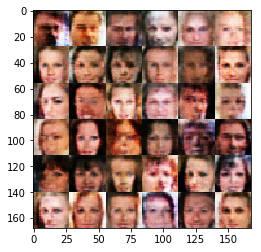

Epoch 1, step 902 Discriminator Loss: 1.2270... Generator Loss: 0.8866
Epoch 1, step 903 Discriminator Loss: 1.5344... Generator Loss: 0.4334
Epoch 1, step 904 Discriminator Loss: 1.2883... Generator Loss: 0.6666
Epoch 1, step 905 Discriminator Loss: 1.1567... Generator Loss: 0.8970
Epoch 1, step 906 Discriminator Loss: 1.6752... Generator Loss: 0.3564
Epoch 1, step 907 Discriminator Loss: 1.2989... Generator Loss: 0.8434
Epoch 1, step 908 Discriminator Loss: 1.4625... Generator Loss: 0.5154
Epoch 1, step 909 Discriminator Loss: 1.5932... Generator Loss: 0.4588
Epoch 1, step 910 Discriminator Loss: 1.3231... Generator Loss: 0.6967
Epoch 1, step 911 Discriminator Loss: 1.3637... Generator Loss: 0.6195
Epoch 1, step 912 Discriminator Loss: 1.3926... Generator Loss: 0.5875
Epoch 1, step 913 Discriminator Loss: 1.4254... Generator Loss: 0.4899
Epoch 1, step 914 Discriminator Loss: 1.3789... Generator Loss: 0.5606
Epoch 1, step 915 Discriminator Loss: 1.3668... Generator Loss: 0.6965
Epoch 

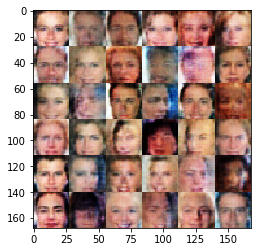

Epoch 1, step 1002 Discriminator Loss: 1.4306... Generator Loss: 0.4722
Epoch 1, step 1003 Discriminator Loss: 1.4862... Generator Loss: 0.5691
Epoch 1, step 1004 Discriminator Loss: 1.5588... Generator Loss: 0.4705
Epoch 1, step 1005 Discriminator Loss: 1.3040... Generator Loss: 0.7512
Epoch 1, step 1006 Discriminator Loss: 1.5788... Generator Loss: 0.4183
Epoch 1, step 1007 Discriminator Loss: 1.4676... Generator Loss: 0.5138
Epoch 1, step 1008 Discriminator Loss: 1.1275... Generator Loss: 0.9955
Epoch 1, step 1009 Discriminator Loss: 1.3460... Generator Loss: 0.5352
Epoch 1, step 1010 Discriminator Loss: 1.6209... Generator Loss: 0.4272
Epoch 1, step 1011 Discriminator Loss: 1.3531... Generator Loss: 0.6167
Epoch 1, step 1012 Discriminator Loss: 1.5894... Generator Loss: 0.3747
Epoch 1, step 1013 Discriminator Loss: 1.3805... Generator Loss: 1.0143
Epoch 1, step 1014 Discriminator Loss: 1.3202... Generator Loss: 0.5502
Epoch 1, step 1015 Discriminator Loss: 1.2426... Generator Loss:

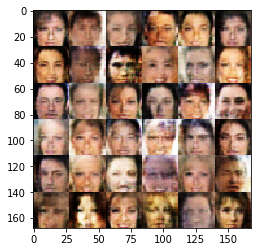

Epoch 1, step 1102 Discriminator Loss: 1.7496... Generator Loss: 0.4398
Epoch 1, step 1103 Discriminator Loss: 1.6963... Generator Loss: 0.3367
Epoch 1, step 1104 Discriminator Loss: 1.3899... Generator Loss: 0.8613
Epoch 1, step 1105 Discriminator Loss: 1.4471... Generator Loss: 0.5667
Epoch 1, step 1106 Discriminator Loss: 1.5777... Generator Loss: 0.4525
Epoch 1, step 1107 Discriminator Loss: 1.5208... Generator Loss: 0.4414
Epoch 1, step 1108 Discriminator Loss: 1.4062... Generator Loss: 0.7041
Epoch 1, step 1109 Discriminator Loss: 1.2122... Generator Loss: 0.7819
Epoch 1, step 1110 Discriminator Loss: 1.3639... Generator Loss: 0.5671
Epoch 1, step 1111 Discriminator Loss: 1.3347... Generator Loss: 0.6168
Epoch 1, step 1112 Discriminator Loss: 1.2009... Generator Loss: 0.7210
Epoch 1, step 1113 Discriminator Loss: 1.5129... Generator Loss: 0.4750
Epoch 1, step 1114 Discriminator Loss: 1.4601... Generator Loss: 0.7002
Epoch 1, step 1115 Discriminator Loss: 1.3820... Generator Loss:

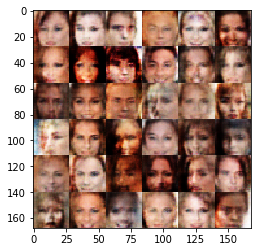

Epoch 1, step 1202 Discriminator Loss: 1.3809... Generator Loss: 0.5492
Epoch 1, step 1203 Discriminator Loss: 1.2801... Generator Loss: 0.7230
Epoch 1, step 1204 Discriminator Loss: 1.3204... Generator Loss: 0.6312
Epoch 1, step 1205 Discriminator Loss: 1.4231... Generator Loss: 0.4870
Epoch 1, step 1206 Discriminator Loss: 1.2362... Generator Loss: 0.6905
Epoch 1, step 1207 Discriminator Loss: 1.3529... Generator Loss: 0.7229
Epoch 1, step 1208 Discriminator Loss: 1.6005... Generator Loss: 0.3915
Epoch 1, step 1209 Discriminator Loss: 1.3436... Generator Loss: 0.6271
Epoch 1, step 1210 Discriminator Loss: 1.5203... Generator Loss: 0.4649
Epoch 1, step 1211 Discriminator Loss: 1.3597... Generator Loss: 1.2481
Epoch 1, step 1212 Discriminator Loss: 1.4474... Generator Loss: 0.5282
Epoch 1, step 1213 Discriminator Loss: 1.5636... Generator Loss: 0.4059
Epoch 1, step 1214 Discriminator Loss: 1.5430... Generator Loss: 0.4680
Epoch 1, step 1215 Discriminator Loss: 1.3550... Generator Loss:

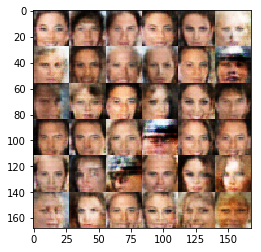

Epoch 1, step 1302 Discriminator Loss: 1.3999... Generator Loss: 0.6706
Epoch 1, step 1303 Discriminator Loss: 1.4871... Generator Loss: 0.5340
Epoch 1, step 1304 Discriminator Loss: 1.1713... Generator Loss: 0.6860
Epoch 1, step 1305 Discriminator Loss: 1.5467... Generator Loss: 0.4709
Epoch 1, step 1306 Discriminator Loss: 1.4375... Generator Loss: 0.4809
Epoch 1, step 1307 Discriminator Loss: 1.3260... Generator Loss: 0.9226
Epoch 1, step 1308 Discriminator Loss: 1.3579... Generator Loss: 0.5387
Epoch 1, step 1309 Discriminator Loss: 1.2992... Generator Loss: 0.5913
Epoch 1, step 1310 Discriminator Loss: 1.2932... Generator Loss: 0.6387
Epoch 1, step 1311 Discriminator Loss: 1.1992... Generator Loss: 0.8281
Epoch 1, step 1312 Discriminator Loss: 1.5520... Generator Loss: 0.4403
Epoch 1, step 1313 Discriminator Loss: 1.3621... Generator Loss: 0.5114
Epoch 1, step 1314 Discriminator Loss: 1.1289... Generator Loss: 0.8956
Epoch 1, step 1315 Discriminator Loss: 1.5575... Generator Loss:

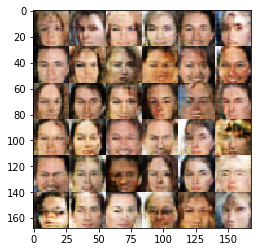

Epoch 1, step 1402 Discriminator Loss: 1.4189... Generator Loss: 0.5332
Epoch 1, step 1403 Discriminator Loss: 1.4695... Generator Loss: 0.5010
Epoch 1, step 1404 Discriminator Loss: 1.1949... Generator Loss: 0.8883
Epoch 1, step 1405 Discriminator Loss: 1.4969... Generator Loss: 0.5064
Epoch 1, step 1406 Discriminator Loss: 1.7242... Generator Loss: 0.3531
Epoch 1, step 1407 Discriminator Loss: 1.3910... Generator Loss: 0.8305
Epoch 1, step 1408 Discriminator Loss: 1.3166... Generator Loss: 0.6288
Epoch 1, step 1409 Discriminator Loss: 1.6875... Generator Loss: 0.3550
Epoch 1, step 1410 Discriminator Loss: 1.2440... Generator Loss: 0.8202
Epoch 1, step 1411 Discriminator Loss: 1.2073... Generator Loss: 0.9049
Epoch 1, step 1412 Discriminator Loss: 1.3181... Generator Loss: 0.5809
Epoch 1, step 1413 Discriminator Loss: 1.3635... Generator Loss: 0.5748
Epoch 1, step 1414 Discriminator Loss: 1.4717... Generator Loss: 0.5403
Epoch 1, step 1415 Discriminator Loss: 1.6292... Generator Loss:

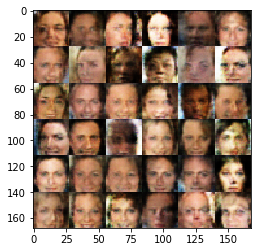

Epoch 1, step 1502 Discriminator Loss: 1.5127... Generator Loss: 0.7106
Epoch 1, step 1503 Discriminator Loss: 1.5219... Generator Loss: 0.4591
Epoch 1, step 1504 Discriminator Loss: 1.5818... Generator Loss: 0.4017
Epoch 1, step 1505 Discriminator Loss: 1.5985... Generator Loss: 0.3980
Epoch 1, step 1506 Discriminator Loss: 1.4231... Generator Loss: 0.6999
Epoch 1, step 1507 Discriminator Loss: 1.7430... Generator Loss: 0.3381
Epoch 1, step 1508 Discriminator Loss: 1.4330... Generator Loss: 0.7302
Epoch 1, step 1509 Discriminator Loss: 1.1070... Generator Loss: 0.9968
Epoch 1, step 1510 Discriminator Loss: 1.7659... Generator Loss: 0.3341
Epoch 1, step 1511 Discriminator Loss: 1.1132... Generator Loss: 1.0043
Epoch 1, step 1512 Discriminator Loss: 1.3433... Generator Loss: 0.5454
Epoch 1, step 1513 Discriminator Loss: 1.2679... Generator Loss: 0.6442
Epoch 1, step 1514 Discriminator Loss: 1.3478... Generator Loss: 0.5463
Epoch 1, step 1515 Discriminator Loss: 1.2960... Generator Loss:

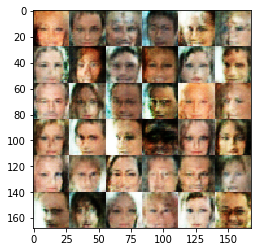

Epoch 1, step 1602 Discriminator Loss: 1.4483... Generator Loss: 0.5190
Epoch 1, step 1603 Discriminator Loss: 1.6103... Generator Loss: 0.4132
Epoch 1, step 1604 Discriminator Loss: 1.3755... Generator Loss: 0.6615
Epoch 1, step 1605 Discriminator Loss: 1.1951... Generator Loss: 0.6970
Epoch 1, step 1606 Discriminator Loss: 1.5140... Generator Loss: 0.4378
Epoch 1, step 1607 Discriminator Loss: 1.3308... Generator Loss: 0.5744
Epoch 1, step 1608 Discriminator Loss: 1.3682... Generator Loss: 0.5940
Epoch 1, step 1609 Discriminator Loss: 1.8715... Generator Loss: 0.3008
Epoch 1, step 1610 Discriminator Loss: 1.4058... Generator Loss: 0.5157
Epoch 1, step 1611 Discriminator Loss: 1.3585... Generator Loss: 0.5367
Epoch 1, step 1612 Discriminator Loss: 1.6804... Generator Loss: 0.3508
Epoch 1, step 1613 Discriminator Loss: 1.2980... Generator Loss: 0.6386
Epoch 1, step 1614 Discriminator Loss: 1.2548... Generator Loss: 0.6060
Epoch 1, step 1615 Discriminator Loss: 1.5469... Generator Loss:

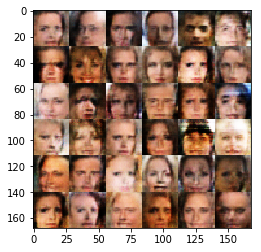

Epoch 1, step 1702 Discriminator Loss: 1.4735... Generator Loss: 0.5398
Epoch 1, step 1703 Discriminator Loss: 1.5500... Generator Loss: 0.4200
Epoch 1, step 1704 Discriminator Loss: 1.3576... Generator Loss: 0.8573
Epoch 1, step 1705 Discriminator Loss: 1.5661... Generator Loss: 0.4133
Epoch 1, step 1706 Discriminator Loss: 1.2196... Generator Loss: 0.7210
Epoch 1, step 1707 Discriminator Loss: 1.1450... Generator Loss: 0.8874
Epoch 1, step 1708 Discriminator Loss: 1.5813... Generator Loss: 0.3933
Epoch 1, step 1709 Discriminator Loss: 1.4378... Generator Loss: 0.5319
Epoch 1, step 1710 Discriminator Loss: 1.2288... Generator Loss: 0.7406
Epoch 1, step 1711 Discriminator Loss: 1.3172... Generator Loss: 0.6339
Epoch 1, step 1712 Discriminator Loss: 1.4488... Generator Loss: 0.4843
Epoch 1, step 1713 Discriminator Loss: 1.5225... Generator Loss: 0.4302
Epoch 1, step 1714 Discriminator Loss: 1.5094... Generator Loss: 0.5083
Epoch 1, step 1715 Discriminator Loss: 1.4892... Generator Loss:

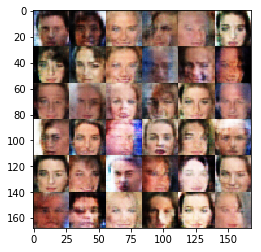

Epoch 1, step 1802 Discriminator Loss: 1.6797... Generator Loss: 0.3792
Epoch 1, step 1803 Discriminator Loss: 1.5491... Generator Loss: 0.6764
Epoch 1, step 1804 Discriminator Loss: 1.4521... Generator Loss: 0.5251
Epoch 1, step 1805 Discriminator Loss: 1.0786... Generator Loss: 0.8369
Epoch 1, step 1806 Discriminator Loss: 1.4116... Generator Loss: 0.5052
Epoch 1, step 1807 Discriminator Loss: 1.4692... Generator Loss: 0.6617
Epoch 1, step 1808 Discriminator Loss: 1.4579... Generator Loss: 0.5453
Epoch 1, step 1809 Discriminator Loss: 1.5654... Generator Loss: 0.4033
Epoch 1, step 1810 Discriminator Loss: 1.3567... Generator Loss: 0.6901
Epoch 1, step 1811 Discriminator Loss: 1.6504... Generator Loss: 0.3797
Epoch 1, step 1812 Discriminator Loss: 1.3667... Generator Loss: 0.7634
Epoch 1, step 1813 Discriminator Loss: 1.1057... Generator Loss: 0.9353
Epoch 1, step 1814 Discriminator Loss: 1.5747... Generator Loss: 0.4032
Epoch 1, step 1815 Discriminator Loss: 1.3263... Generator Loss:

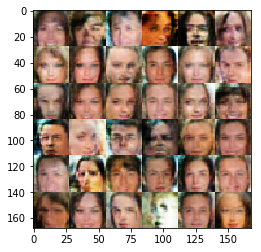

Epoch 1, step 1902 Discriminator Loss: 1.7690... Generator Loss: 0.3127
Epoch 1, step 1903 Discriminator Loss: 1.8315... Generator Loss: 0.2827
Epoch 1, step 1904 Discriminator Loss: 1.1656... Generator Loss: 0.9859
Epoch 1, step 1905 Discriminator Loss: 1.5149... Generator Loss: 0.6258
Epoch 1, step 1906 Discriminator Loss: 1.9952... Generator Loss: 0.2579
Epoch 1, step 1907 Discriminator Loss: 1.9087... Generator Loss: 0.2698
Epoch 1, step 1908 Discriminator Loss: 1.3500... Generator Loss: 0.9413
Epoch 1, step 1909 Discriminator Loss: 1.5005... Generator Loss: 0.4865
Epoch 1, step 1910 Discriminator Loss: 1.5941... Generator Loss: 0.3961
Epoch 1, step 1911 Discriminator Loss: 1.7060... Generator Loss: 0.3874
Epoch 1, step 1912 Discriminator Loss: 1.5676... Generator Loss: 0.5664
Epoch 1, step 1913 Discriminator Loss: 1.7152... Generator Loss: 0.3687
Epoch 1, step 1914 Discriminator Loss: 1.3963... Generator Loss: 0.6339
Epoch 1, step 1915 Discriminator Loss: 1.1004... Generator Loss:

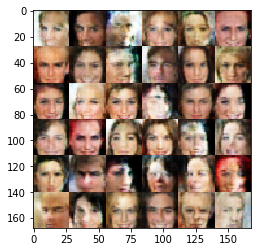

Epoch 1, step 2002 Discriminator Loss: 1.2481... Generator Loss: 0.7706
Epoch 1, step 2003 Discriminator Loss: 1.5968... Generator Loss: 0.3720
Epoch 1, step 2004 Discriminator Loss: 1.2205... Generator Loss: 0.6717
Epoch 1, step 2005 Discriminator Loss: 1.3434... Generator Loss: 0.9182
Epoch 1, step 2006 Discriminator Loss: 1.6768... Generator Loss: 0.3483
Epoch 1, step 2007 Discriminator Loss: 1.5218... Generator Loss: 0.4895
Epoch 1, step 2008 Discriminator Loss: 1.1983... Generator Loss: 0.7961
Epoch 1, step 2009 Discriminator Loss: 1.6981... Generator Loss: 0.3665
Epoch 1, step 2010 Discriminator Loss: 1.4826... Generator Loss: 0.4661
Epoch 1, step 2011 Discriminator Loss: 1.4237... Generator Loss: 0.5529
Epoch 1, step 2012 Discriminator Loss: 1.6913... Generator Loss: 0.3639
Epoch 1, step 2013 Discriminator Loss: 1.4145... Generator Loss: 0.5417
Epoch 1, step 2014 Discriminator Loss: 1.3364... Generator Loss: 0.5554
Epoch 1, step 2015 Discriminator Loss: 1.3919... Generator Loss:

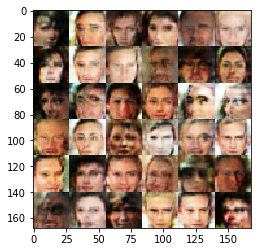

Epoch 1, step 2102 Discriminator Loss: 1.3632... Generator Loss: 0.5536
Epoch 1, step 2103 Discriminator Loss: 1.4263... Generator Loss: 0.4966
Epoch 1, step 2104 Discriminator Loss: 1.3782... Generator Loss: 0.5185
Epoch 1, step 2105 Discriminator Loss: 1.3068... Generator Loss: 0.7103
Epoch 1, step 2106 Discriminator Loss: 1.5528... Generator Loss: 0.4487
Epoch 1, step 2107 Discriminator Loss: 1.4681... Generator Loss: 0.4686
Epoch 1, step 2108 Discriminator Loss: 1.4169... Generator Loss: 0.7646
Epoch 1, step 2109 Discriminator Loss: 1.6537... Generator Loss: 0.3709
Epoch 1, step 2110 Discriminator Loss: 1.4708... Generator Loss: 0.4435
Epoch 1, step 2111 Discriminator Loss: 1.0694... Generator Loss: 0.9424
Epoch 1, step 2112 Discriminator Loss: 1.5395... Generator Loss: 0.4809
Epoch 1, step 2113 Discriminator Loss: 1.6244... Generator Loss: 0.3740
Epoch 1, step 2114 Discriminator Loss: 1.3172... Generator Loss: 0.6833
Epoch 1, step 2115 Discriminator Loss: 1.3653... Generator Loss:

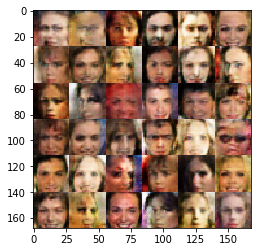

Epoch 1, step 2202 Discriminator Loss: 1.4743... Generator Loss: 0.4968
Epoch 1, step 2203 Discriminator Loss: 1.3903... Generator Loss: 0.7120
Epoch 1, step 2204 Discriminator Loss: 1.5010... Generator Loss: 0.4432
Epoch 1, step 2205 Discriminator Loss: 1.9624... Generator Loss: 0.2538
Epoch 1, step 2206 Discriminator Loss: 1.2188... Generator Loss: 0.9298
Epoch 1, step 2207 Discriminator Loss: 1.8252... Generator Loss: 0.2983
Epoch 1, step 2208 Discriminator Loss: 1.3180... Generator Loss: 0.8094
Epoch 1, step 2209 Discriminator Loss: 1.5944... Generator Loss: 0.3973
Epoch 1, step 2210 Discriminator Loss: 1.2047... Generator Loss: 0.7635
Epoch 1, step 2211 Discriminator Loss: 1.5695... Generator Loss: 0.4296
Epoch 1, step 2212 Discriminator Loss: 1.3198... Generator Loss: 0.5721
Epoch 1, step 2213 Discriminator Loss: 1.2773... Generator Loss: 0.6278
Epoch 1, step 2214 Discriminator Loss: 1.3762... Generator Loss: 0.7155
Epoch 1, step 2215 Discriminator Loss: 1.7270... Generator Loss:

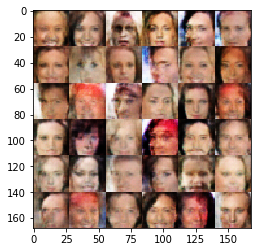

Epoch 1, step 2302 Discriminator Loss: 1.4856... Generator Loss: 0.4199
Epoch 1, step 2303 Discriminator Loss: 1.2997... Generator Loss: 0.6402
Epoch 1, step 2304 Discriminator Loss: 1.3769... Generator Loss: 0.6001
Epoch 1, step 2305 Discriminator Loss: 1.4577... Generator Loss: 0.4660
Epoch 1, step 2306 Discriminator Loss: 1.3714... Generator Loss: 0.5630
Epoch 1, step 2307 Discriminator Loss: 1.7327... Generator Loss: 0.3937
Epoch 1, step 2308 Discriminator Loss: 1.4016... Generator Loss: 0.5469
Epoch 1, step 2309 Discriminator Loss: 1.6750... Generator Loss: 0.3930
Epoch 1, step 2310 Discriminator Loss: 1.2537... Generator Loss: 0.6280
Epoch 1, step 2311 Discriminator Loss: 1.8488... Generator Loss: 0.2930
Epoch 1, step 2312 Discriminator Loss: 1.2059... Generator Loss: 1.0436
Epoch 1, step 2313 Discriminator Loss: 1.3961... Generator Loss: 0.5657
Epoch 1, step 2314 Discriminator Loss: 1.7248... Generator Loss: 0.3204
Epoch 1, step 2315 Discriminator Loss: 1.5453... Generator Loss:

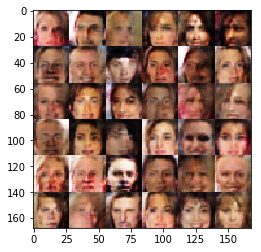

Epoch 1, step 2402 Discriminator Loss: 1.4851... Generator Loss: 0.5228
Epoch 1, step 2403 Discriminator Loss: 1.5721... Generator Loss: 0.4087
Epoch 1, step 2404 Discriminator Loss: 1.6129... Generator Loss: 0.4728
Epoch 1, step 2405 Discriminator Loss: 1.1250... Generator Loss: 0.8018
Epoch 1, step 2406 Discriminator Loss: 1.4115... Generator Loss: 0.5309
Epoch 1, step 2407 Discriminator Loss: 1.8198... Generator Loss: 0.3110
Epoch 1, step 2408 Discriminator Loss: 1.4069... Generator Loss: 1.3224
Epoch 1, step 2409 Discriminator Loss: 1.5466... Generator Loss: 0.4472
Epoch 1, step 2410 Discriminator Loss: 1.8358... Generator Loss: 0.2765
Epoch 1, step 2411 Discriminator Loss: 1.5805... Generator Loss: 0.4057
Epoch 1, step 2412 Discriminator Loss: 1.2478... Generator Loss: 0.6445
Epoch 1, step 2413 Discriminator Loss: 1.7979... Generator Loss: 0.3074
Epoch 1, step 2414 Discriminator Loss: 1.8887... Generator Loss: 0.3289
Epoch 1, step 2415 Discriminator Loss: 1.7369... Generator Loss:

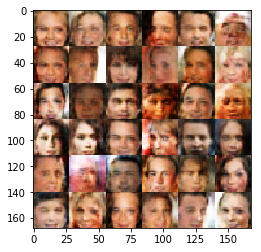

Epoch 1, step 2502 Discriminator Loss: 1.2184... Generator Loss: 0.9494
Epoch 1, step 2503 Discriminator Loss: 1.3948... Generator Loss: 0.5580
Epoch 1, step 2504 Discriminator Loss: 1.6318... Generator Loss: 0.3700
Epoch 1, step 2505 Discriminator Loss: 1.2887... Generator Loss: 0.7303
Epoch 1, step 2506 Discriminator Loss: 1.5660... Generator Loss: 0.4046
Epoch 1, step 2507 Discriminator Loss: 1.3473... Generator Loss: 0.5486
Epoch 1, step 2508 Discriminator Loss: 1.2395... Generator Loss: 0.8479
Epoch 1, step 2509 Discriminator Loss: 1.5574... Generator Loss: 0.3968
Epoch 1, step 2510 Discriminator Loss: 1.5425... Generator Loss: 0.4365
Epoch 1, step 2511 Discriminator Loss: 1.5553... Generator Loss: 0.4449
Epoch 1, step 2512 Discriminator Loss: 1.4996... Generator Loss: 0.4847
Epoch 1, step 2513 Discriminator Loss: 1.5096... Generator Loss: 0.4659
Epoch 1, step 2514 Discriminator Loss: 1.4831... Generator Loss: 0.4516
Epoch 1, step 2515 Discriminator Loss: 1.5287... Generator Loss:

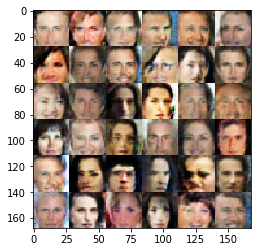

Epoch 1, step 2602 Discriminator Loss: 1.4564... Generator Loss: 0.4658
Epoch 1, step 2603 Discriminator Loss: 1.2148... Generator Loss: 0.7474
Epoch 1, step 2604 Discriminator Loss: 1.5621... Generator Loss: 0.4007
Epoch 1, step 2605 Discriminator Loss: 1.1105... Generator Loss: 0.7926
Epoch 1, step 2606 Discriminator Loss: 1.7629... Generator Loss: 0.3335
Epoch 1, step 2607 Discriminator Loss: 1.4676... Generator Loss: 0.4971
Epoch 1, step 2608 Discriminator Loss: 1.7852... Generator Loss: 0.3097
Epoch 1, step 2609 Discriminator Loss: 1.2060... Generator Loss: 0.8832
Epoch 1, step 2610 Discriminator Loss: 1.5333... Generator Loss: 0.4623
Epoch 1, step 2611 Discriminator Loss: 1.7422... Generator Loss: 0.3228
Epoch 1, step 2612 Discriminator Loss: 1.3668... Generator Loss: 0.6291
Epoch 1, step 2613 Discriminator Loss: 1.8037... Generator Loss: 0.3018
Epoch 1, step 2614 Discriminator Loss: 1.2493... Generator Loss: 0.7079
Epoch 1, step 2615 Discriminator Loss: 1.5526... Generator Loss:

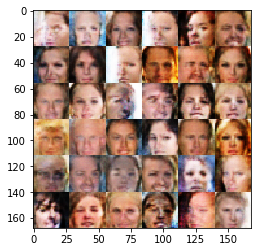

Epoch 1, step 2702 Discriminator Loss: 1.1923... Generator Loss: 0.8083
Epoch 1, step 2703 Discriminator Loss: 1.8061... Generator Loss: 0.2999
Epoch 1, step 2704 Discriminator Loss: 1.2568... Generator Loss: 0.6233
Epoch 1, step 2705 Discriminator Loss: 1.5093... Generator Loss: 0.4680
Epoch 1, step 2706 Discriminator Loss: 1.6053... Generator Loss: 0.3970
Epoch 1, step 2707 Discriminator Loss: 1.4540... Generator Loss: 0.4671
Epoch 1, step 2708 Discriminator Loss: 1.2118... Generator Loss: 0.8567
Epoch 1, step 2709 Discriminator Loss: 1.4948... Generator Loss: 0.4765
Epoch 1, step 2710 Discriminator Loss: 1.5925... Generator Loss: 0.3959
Epoch 1, step 2711 Discriminator Loss: 1.4791... Generator Loss: 0.5554
Epoch 1, step 2712 Discriminator Loss: 1.5381... Generator Loss: 0.4531
Epoch 1, step 2713 Discriminator Loss: 1.6625... Generator Loss: 0.3432
Epoch 1, step 2714 Discriminator Loss: 1.1033... Generator Loss: 0.8955
Epoch 1, step 2715 Discriminator Loss: 1.6377... Generator Loss:

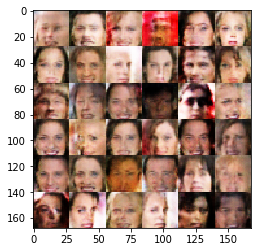

Epoch 1, step 2802 Discriminator Loss: 1.3453... Generator Loss: 0.6328
Epoch 1, step 2803 Discriminator Loss: 1.7061... Generator Loss: 0.3396
Epoch 1, step 2804 Discriminator Loss: 1.8653... Generator Loss: 0.2972
Epoch 1, step 2805 Discriminator Loss: 1.7394... Generator Loss: 0.3907
Epoch 1, step 2806 Discriminator Loss: 1.3811... Generator Loss: 0.5555
Epoch 1, step 2807 Discriminator Loss: 1.6003... Generator Loss: 0.3967
Epoch 1, step 2808 Discriminator Loss: 1.1721... Generator Loss: 0.7071
Epoch 1, step 2809 Discriminator Loss: 1.1557... Generator Loss: 0.9586
Epoch 1, step 2810 Discriminator Loss: 2.1382... Generator Loss: 0.1947
Epoch 1, step 2811 Discriminator Loss: 1.3087... Generator Loss: 1.8846
Epoch 1, step 2812 Discriminator Loss: 1.3618... Generator Loss: 0.5565
Epoch 1, step 2813 Discriminator Loss: 2.0289... Generator Loss: 0.2280
Epoch 1, step 2814 Discriminator Loss: 1.5646... Generator Loss: 0.4757
Epoch 1, step 2815 Discriminator Loss: 1.3075... Generator Loss:

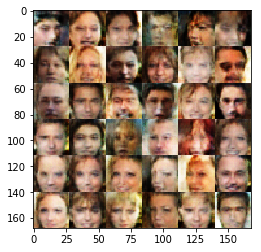

Epoch 1, step 2902 Discriminator Loss: 1.5326... Generator Loss: 0.4298
Epoch 1, step 2903 Discriminator Loss: 1.5402... Generator Loss: 0.4029
Epoch 1, step 2904 Discriminator Loss: 1.2096... Generator Loss: 0.8330
Epoch 1, step 2905 Discriminator Loss: 1.4753... Generator Loss: 0.4491
Epoch 1, step 2906 Discriminator Loss: 1.5404... Generator Loss: 0.4336
Epoch 1, step 2907 Discriminator Loss: 1.7972... Generator Loss: 0.3378
Epoch 1, step 2908 Discriminator Loss: 1.4680... Generator Loss: 0.5425
Epoch 1, step 2909 Discriminator Loss: 1.3640... Generator Loss: 0.5222
Epoch 1, step 2910 Discriminator Loss: 1.4428... Generator Loss: 0.5368
Epoch 1, step 2911 Discriminator Loss: 1.5337... Generator Loss: 0.4276
Epoch 1, step 2912 Discriminator Loss: 2.0986... Generator Loss: 0.2401
Epoch 1, step 2913 Discriminator Loss: 1.3208... Generator Loss: 0.9379
Epoch 1, step 2914 Discriminator Loss: 1.8069... Generator Loss: 0.3257
Epoch 1, step 2915 Discriminator Loss: 1.7806... Generator Loss:

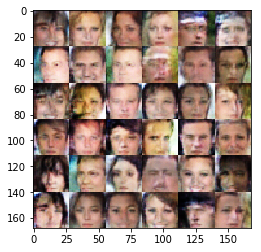

Epoch 1, step 3002 Discriminator Loss: 1.4452... Generator Loss: 0.5037
Epoch 1, step 3003 Discriminator Loss: 1.8577... Generator Loss: 0.2881
Epoch 1, step 3004 Discriminator Loss: 1.7482... Generator Loss: 0.3506
Epoch 1, step 3005 Discriminator Loss: 1.4991... Generator Loss: 0.7688
Epoch 1, step 3006 Discriminator Loss: 1.5301... Generator Loss: 0.4374
Epoch 1, step 3007 Discriminator Loss: 1.6516... Generator Loss: 0.3550
Epoch 1, step 3008 Discriminator Loss: 1.1758... Generator Loss: 0.9023
Epoch 1, step 3009 Discriminator Loss: 1.8238... Generator Loss: 0.2960
Epoch 1, step 3010 Discriminator Loss: 1.2418... Generator Loss: 0.7018
Epoch 1, step 3011 Discriminator Loss: 1.4166... Generator Loss: 0.5029
Epoch 1, step 3012 Discriminator Loss: 1.6366... Generator Loss: 0.3952
Epoch 1, step 3013 Discriminator Loss: 1.5749... Generator Loss: 0.4110
Epoch 1, step 3014 Discriminator Loss: 1.4053... Generator Loss: 0.5689
Epoch 1, step 3015 Discriminator Loss: 1.2417... Generator Loss:

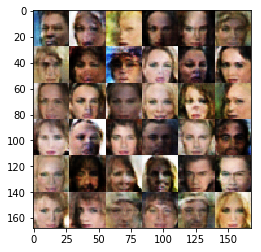

Epoch 1, step 3102 Discriminator Loss: 1.2660... Generator Loss: 0.6418
Epoch 1, step 3103 Discriminator Loss: 1.2319... Generator Loss: 0.6607
Epoch 1, step 3104 Discriminator Loss: 1.4530... Generator Loss: 0.4472
Epoch 1, step 3105 Discriminator Loss: 1.0806... Generator Loss: 0.7852
Epoch 1, step 3106 Discriminator Loss: 1.5247... Generator Loss: 0.5136
Epoch 1, step 3107 Discriminator Loss: 1.5427... Generator Loss: 0.3995
Epoch 1, step 3108 Discriminator Loss: 1.4368... Generator Loss: 0.5318
Epoch 1, step 3109 Discriminator Loss: 1.5061... Generator Loss: 0.4960
Epoch 1, step 3110 Discriminator Loss: 1.7545... Generator Loss: 0.3030
Epoch 1, step 3111 Discriminator Loss: 1.5121... Generator Loss: 0.7529
Epoch 1, step 3112 Discriminator Loss: 1.6393... Generator Loss: 0.3900
Epoch 1, step 3113 Discriminator Loss: 1.9737... Generator Loss: 0.2433
Epoch 1, step 3114 Discriminator Loss: 1.2273... Generator Loss: 1.1055
Epoch 1, step 3115 Discriminator Loss: 1.6539... Generator Loss:

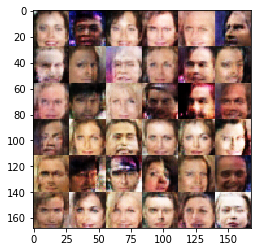

Epoch 1, step 3202 Discriminator Loss: 1.4895... Generator Loss: 0.4340
Epoch 1, step 3203 Discriminator Loss: 1.3824... Generator Loss: 0.5307
Epoch 1, step 3204 Discriminator Loss: 1.4000... Generator Loss: 0.6180
Epoch 1, step 3205 Discriminator Loss: 1.6813... Generator Loss: 0.3356
Epoch 1, step 3206 Discriminator Loss: 1.1173... Generator Loss: 0.9360
Epoch 1, step 3207 Discriminator Loss: 1.4994... Generator Loss: 0.4477
Epoch 1, step 3208 Discriminator Loss: 1.2342... Generator Loss: 0.7070
Epoch 1, step 3209 Discriminator Loss: 1.2289... Generator Loss: 0.6613
Epoch 1, step 3210 Discriminator Loss: 1.3034... Generator Loss: 0.5721
Epoch 1, step 3211 Discriminator Loss: 1.2684... Generator Loss: 0.5914
Epoch 1, step 3212 Discriminator Loss: 1.4300... Generator Loss: 0.5074
Epoch 1, step 3213 Discriminator Loss: 1.3268... Generator Loss: 0.5546
Epoch 1, step 3214 Discriminator Loss: 1.4907... Generator Loss: 0.4344
Epoch 1, step 3215 Discriminator Loss: 1.2633... Generator Loss:

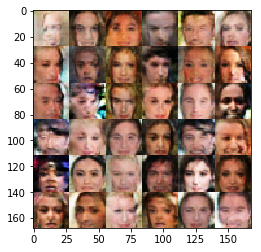

Epoch 1, step 3302 Discriminator Loss: 1.4028... Generator Loss: 0.7541
Epoch 1, step 3303 Discriminator Loss: 1.7329... Generator Loss: 0.3319
Epoch 1, step 3304 Discriminator Loss: 2.1116... Generator Loss: 0.2189
Epoch 1, step 3305 Discriminator Loss: 1.3893... Generator Loss: 1.0296
Epoch 1, step 3306 Discriminator Loss: 1.9124... Generator Loss: 0.2627
Epoch 1, step 3307 Discriminator Loss: 1.3059... Generator Loss: 0.7255
Epoch 1, step 3308 Discriminator Loss: 1.6362... Generator Loss: 0.3684
Epoch 1, step 3309 Discriminator Loss: 1.6405... Generator Loss: 0.4288
Epoch 1, step 3310 Discriminator Loss: 1.6192... Generator Loss: 0.3650
Epoch 1, step 3311 Discriminator Loss: 1.3569... Generator Loss: 0.6350
Epoch 1, step 3312 Discriminator Loss: 1.3777... Generator Loss: 0.5799
Epoch 1, step 3313 Discriminator Loss: 1.6391... Generator Loss: 0.3544
Epoch 1, step 3314 Discriminator Loss: 1.0563... Generator Loss: 0.8132
Epoch 1, step 3315 Discriminator Loss: 1.2406... Generator Loss:

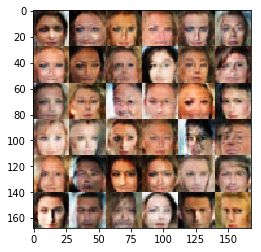

Epoch 1, step 3402 Discriminator Loss: 1.1858... Generator Loss: 0.7584
Epoch 1, step 3403 Discriminator Loss: 1.7657... Generator Loss: 0.3172
Epoch 1, step 3404 Discriminator Loss: 1.3248... Generator Loss: 0.7557
Epoch 1, step 3405 Discriminator Loss: 1.0378... Generator Loss: 0.9483
Epoch 1, step 3406 Discriminator Loss: 1.2082... Generator Loss: 0.6317
Epoch 1, step 3407 Discriminator Loss: 1.5271... Generator Loss: 0.3926
Epoch 1, step 3408 Discriminator Loss: 1.0601... Generator Loss: 1.0660
Epoch 1, step 3409 Discriminator Loss: 1.2389... Generator Loss: 0.6039
Epoch 1, step 3410 Discriminator Loss: 1.4537... Generator Loss: 0.4812
Epoch 1, step 3411 Discriminator Loss: 1.3048... Generator Loss: 0.5839
Epoch 1, step 3412 Discriminator Loss: 0.8436... Generator Loss: 1.3027
Epoch 1, step 3413 Discriminator Loss: 1.5531... Generator Loss: 0.4049
Epoch 1, step 3414 Discriminator Loss: 1.5759... Generator Loss: 0.3837
Epoch 1, step 3415 Discriminator Loss: 1.5813... Generator Loss:

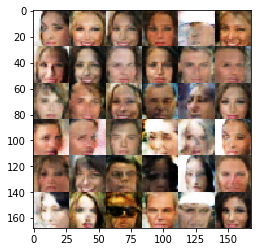

Epoch 1, step 3502 Discriminator Loss: 1.2304... Generator Loss: 0.6603
Epoch 1, step 3503 Discriminator Loss: 1.6786... Generator Loss: 0.3703
Epoch 1, step 3504 Discriminator Loss: 1.3164... Generator Loss: 0.7722
Epoch 1, step 3505 Discriminator Loss: 1.8575... Generator Loss: 0.2748
Epoch 1, step 3506 Discriminator Loss: 1.0629... Generator Loss: 0.9460
Epoch 1, step 3507 Discriminator Loss: 1.8509... Generator Loss: 0.2960
Epoch 1, step 3508 Discriminator Loss: 1.3033... Generator Loss: 0.5573
Epoch 1, step 3509 Discriminator Loss: 1.3727... Generator Loss: 0.5301
Epoch 1, step 3510 Discriminator Loss: 1.6629... Generator Loss: 0.3548
Epoch 1, step 3511 Discriminator Loss: 1.4600... Generator Loss: 0.5376
Epoch 1, step 3512 Discriminator Loss: 1.2805... Generator Loss: 0.6615
Epoch 1, step 3513 Discriminator Loss: 1.2183... Generator Loss: 0.6632
Epoch 1, step 3514 Discriminator Loss: 2.4398... Generator Loss: 0.1579
Epoch 1, step 3515 Discriminator Loss: 1.7186... Generator Loss:

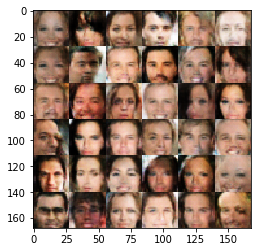

Epoch 1, step 3602 Discriminator Loss: 1.0375... Generator Loss: 1.2145
Epoch 1, step 3603 Discriminator Loss: 1.6576... Generator Loss: 0.3719
Epoch 1, step 3604 Discriminator Loss: 1.3777... Generator Loss: 0.4969
Epoch 1, step 3605 Discriminator Loss: 1.1714... Generator Loss: 0.7127
Epoch 1, step 3606 Discriminator Loss: 1.8200... Generator Loss: 0.2738
Epoch 1, step 3607 Discriminator Loss: 1.0656... Generator Loss: 0.8514
Epoch 1, step 3608 Discriminator Loss: 1.3094... Generator Loss: 0.5705
Epoch 1, step 3609 Discriminator Loss: 1.3104... Generator Loss: 0.6205
Epoch 1, step 3610 Discriminator Loss: 2.0981... Generator Loss: 0.2162
Epoch 1, step 3611 Discriminator Loss: 0.9799... Generator Loss: 1.2456
Epoch 1, step 3612 Discriminator Loss: 1.5933... Generator Loss: 0.3703
Epoch 1, step 3613 Discriminator Loss: 1.6400... Generator Loss: 0.3698
Epoch 1, step 3614 Discriminator Loss: 1.3308... Generator Loss: 0.5741
Epoch 1, step 3615 Discriminator Loss: 1.4198... Generator Loss:

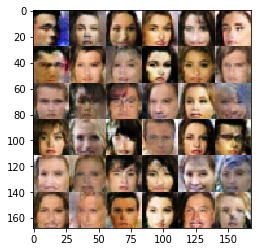

Epoch 1, step 3702 Discriminator Loss: 1.5367... Generator Loss: 0.4126
Epoch 1, step 3703 Discriminator Loss: 1.5916... Generator Loss: 0.4088
Epoch 1, step 3704 Discriminator Loss: 1.5876... Generator Loss: 0.4488
Epoch 1, step 3705 Discriminator Loss: 1.6023... Generator Loss: 0.3784
Epoch 1, step 3706 Discriminator Loss: 1.1155... Generator Loss: 0.9877
Epoch 1, step 3707 Discriminator Loss: 1.3473... Generator Loss: 0.5396
Epoch 1, step 3708 Discriminator Loss: 1.7908... Generator Loss: 0.2837
Epoch 1, step 3709 Discriminator Loss: 1.4725... Generator Loss: 0.4362
Epoch 1, step 3710 Discriminator Loss: 1.3363... Generator Loss: 0.5652
Epoch 1, step 3711 Discriminator Loss: 2.0081... Generator Loss: 0.2348
Epoch 1, step 3712 Discriminator Loss: 1.3052... Generator Loss: 0.7822
Epoch 1, step 3713 Discriminator Loss: 1.7872... Generator Loss: 0.3066
Epoch 1, step 3714 Discriminator Loss: 1.8035... Generator Loss: 0.3418
Epoch 1, step 3715 Discriminator Loss: 1.1669... Generator Loss:

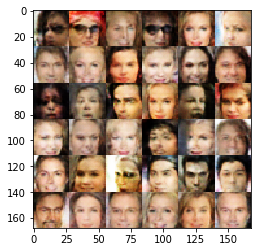

Epoch 1, step 3802 Discriminator Loss: 1.4605... Generator Loss: 0.4583
Epoch 1, step 3803 Discriminator Loss: 1.1569... Generator Loss: 1.1080
Epoch 1, step 3804 Discriminator Loss: 1.3659... Generator Loss: 0.5174
Epoch 1, step 3805 Discriminator Loss: 1.6939... Generator Loss: 0.3182
Epoch 1, step 3806 Discriminator Loss: 1.1789... Generator Loss: 0.6793
Epoch 1, step 3807 Discriminator Loss: 1.3801... Generator Loss: 0.5515
Epoch 1, step 3808 Discriminator Loss: 1.2512... Generator Loss: 0.6476
Epoch 1, step 3809 Discriminator Loss: 1.3750... Generator Loss: 0.4964
Epoch 1, step 3810 Discriminator Loss: 1.3224... Generator Loss: 0.5991
Epoch 1, step 3811 Discriminator Loss: 1.3351... Generator Loss: 0.5313
Epoch 1, step 3812 Discriminator Loss: 1.4800... Generator Loss: 0.4515
Epoch 1, step 3813 Discriminator Loss: 1.5869... Generator Loss: 0.3590
Epoch 1, step 3814 Discriminator Loss: 1.1395... Generator Loss: 0.7787
Epoch 1, step 3815 Discriminator Loss: 1.1336... Generator Loss:

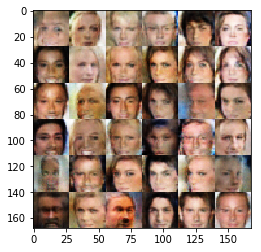

Epoch 1, step 3902 Discriminator Loss: 1.3100... Generator Loss: 0.9342
Epoch 1, step 3903 Discriminator Loss: 1.9420... Generator Loss: 0.2468
Epoch 1, step 3904 Discriminator Loss: 1.1743... Generator Loss: 0.7885
Epoch 1, step 3905 Discriminator Loss: 1.5208... Generator Loss: 0.4401
Epoch 1, step 3906 Discriminator Loss: 1.0830... Generator Loss: 0.7796
Epoch 1, step 3907 Discriminator Loss: 1.8233... Generator Loss: 0.2836
Epoch 1, step 3908 Discriminator Loss: 1.4471... Generator Loss: 0.4835
Epoch 1, step 3909 Discriminator Loss: 1.6810... Generator Loss: 0.3352
Epoch 1, step 3910 Discriminator Loss: 1.1115... Generator Loss: 0.9816
Epoch 1, step 3911 Discriminator Loss: 1.5095... Generator Loss: 0.4180
Epoch 1, step 3912 Discriminator Loss: 1.1793... Generator Loss: 0.7437
Epoch 1, step 3913 Discriminator Loss: 1.3134... Generator Loss: 0.5639
Epoch 1, step 3914 Discriminator Loss: 1.7221... Generator Loss: 0.3421
Epoch 1, step 3915 Discriminator Loss: 1.0827... Generator Loss:

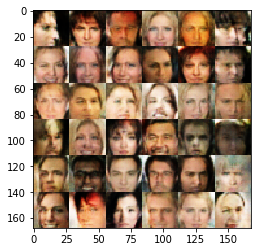

Epoch 1, step 4002 Discriminator Loss: 1.1284... Generator Loss: 0.8645
Epoch 1, step 4003 Discriminator Loss: 1.9059... Generator Loss: 0.2539
Epoch 1, step 4004 Discriminator Loss: 1.3910... Generator Loss: 0.5665
Epoch 1, step 4005 Discriminator Loss: 1.9998... Generator Loss: 0.2400
Epoch 1, step 4006 Discriminator Loss: 2.0795... Generator Loss: 0.2148
Epoch 1, step 4007 Discriminator Loss: 1.0772... Generator Loss: 1.0948
Epoch 1, step 4008 Discriminator Loss: 1.8419... Generator Loss: 0.3297
Epoch 1, step 4009 Discriminator Loss: 1.2497... Generator Loss: 0.5917
Epoch 1, step 4010 Discriminator Loss: 1.0336... Generator Loss: 1.0952
Epoch 1, step 4011 Discriminator Loss: 1.3576... Generator Loss: 0.5371
Epoch 1, step 4012 Discriminator Loss: 1.4297... Generator Loss: 0.4608
Epoch 1, step 4013 Discriminator Loss: 1.3066... Generator Loss: 0.6243
Epoch 1, step 4014 Discriminator Loss: 1.7825... Generator Loss: 0.2923
Epoch 1, step 4015 Discriminator Loss: 1.2688... Generator Loss:

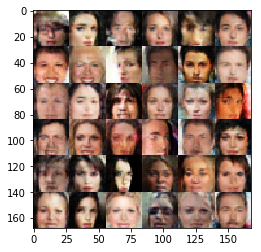

Epoch 1, step 4102 Discriminator Loss: 1.4457... Generator Loss: 0.5343
Epoch 1, step 4103 Discriminator Loss: 1.4744... Generator Loss: 0.4370
Epoch 1, step 4104 Discriminator Loss: 1.4063... Generator Loss: 0.4685
Epoch 1, step 4105 Discriminator Loss: 1.2570... Generator Loss: 0.8096
Epoch 1, step 4106 Discriminator Loss: 1.5016... Generator Loss: 0.4434
Epoch 1, step 4107 Discriminator Loss: 1.5691... Generator Loss: 0.3941
Epoch 1, step 4108 Discriminator Loss: 1.0693... Generator Loss: 0.9330
Epoch 1, step 4109 Discriminator Loss: 1.4946... Generator Loss: 0.4309
Epoch 1, step 4110 Discriminator Loss: 2.0723... Generator Loss: 0.2096
Epoch 1, step 4111 Discriminator Loss: 1.2307... Generator Loss: 0.8501
Epoch 1, step 4112 Discriminator Loss: 1.6158... Generator Loss: 0.4070
Epoch 1, step 4113 Discriminator Loss: 1.9617... Generator Loss: 0.2582
Epoch 1, step 4114 Discriminator Loss: 1.7372... Generator Loss: 0.3631
Epoch 1, step 4115 Discriminator Loss: 1.5221... Generator Loss:

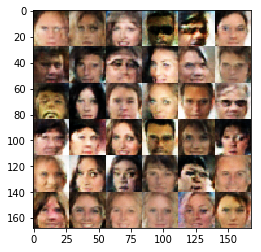

Epoch 1, step 4202 Discriminator Loss: 1.0595... Generator Loss: 1.1997
Epoch 1, step 4203 Discriminator Loss: 1.5751... Generator Loss: 0.4158
Epoch 1, step 4204 Discriminator Loss: 1.5321... Generator Loss: 0.4015
Epoch 1, step 4205 Discriminator Loss: 1.5787... Generator Loss: 0.4312
Epoch 1, step 4206 Discriminator Loss: 1.4689... Generator Loss: 0.5781
Epoch 1, step 4207 Discriminator Loss: 1.6879... Generator Loss: 0.3444
Epoch 1, step 4208 Discriminator Loss: 1.0893... Generator Loss: 0.8637
Epoch 1, step 4209 Discriminator Loss: 1.3197... Generator Loss: 0.6104
Epoch 1, step 4210 Discriminator Loss: 2.0066... Generator Loss: 0.2383
Epoch 1, step 4211 Discriminator Loss: 1.0768... Generator Loss: 1.5930
Epoch 1, step 4212 Discriminator Loss: 1.4813... Generator Loss: 0.4246
Epoch 1, step 4213 Discriminator Loss: 1.5706... Generator Loss: 0.3950
Epoch 1, step 4214 Discriminator Loss: 1.0984... Generator Loss: 1.4470
Epoch 1, step 4215 Discriminator Loss: 1.2322... Generator Loss:

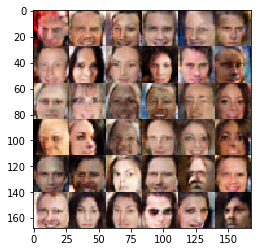

Epoch 1, step 4302 Discriminator Loss: 1.3800... Generator Loss: 0.4822
Epoch 1, step 4303 Discriminator Loss: 1.2566... Generator Loss: 0.6172
Epoch 1, step 4304 Discriminator Loss: 1.0811... Generator Loss: 0.7588
Epoch 1, step 4305 Discriminator Loss: 1.6627... Generator Loss: 0.3616
Epoch 1, step 4306 Discriminator Loss: 1.6150... Generator Loss: 0.4231
Epoch 1, step 4307 Discriminator Loss: 1.2452... Generator Loss: 0.6164
Epoch 1, step 4308 Discriminator Loss: 1.8176... Generator Loss: 0.3030
Epoch 1, step 4309 Discriminator Loss: 1.2803... Generator Loss: 0.8772
Epoch 1, step 4310 Discriminator Loss: 1.9695... Generator Loss: 0.2454
Epoch 1, step 4311 Discriminator Loss: 1.3155... Generator Loss: 0.5742
Epoch 1, step 4312 Discriminator Loss: 1.4912... Generator Loss: 0.4460
Epoch 1, step 4313 Discriminator Loss: 1.8020... Generator Loss: 0.3005
Epoch 1, step 4314 Discriminator Loss: 1.2688... Generator Loss: 0.6568
Epoch 1, step 4315 Discriminator Loss: 1.6295... Generator Loss:

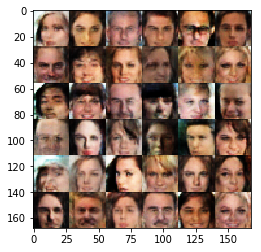

Epoch 1, step 4402 Discriminator Loss: 1.9872... Generator Loss: 0.2423
Epoch 1, step 4403 Discriminator Loss: 1.6296... Generator Loss: 0.5467
Epoch 1, step 4404 Discriminator Loss: 1.2592... Generator Loss: 0.7029
Epoch 1, step 4405 Discriminator Loss: 1.5793... Generator Loss: 0.3943
Epoch 1, step 4406 Discriminator Loss: 1.9866... Generator Loss: 0.2291
Epoch 1, step 4407 Discriminator Loss: 1.1185... Generator Loss: 1.3627
Epoch 1, step 4408 Discriminator Loss: 1.2657... Generator Loss: 0.5889
Epoch 1, step 4409 Discriminator Loss: 1.6134... Generator Loss: 0.3787
Epoch 1, step 4410 Discriminator Loss: 1.3584... Generator Loss: 0.5602
Epoch 1, step 4411 Discriminator Loss: 1.5927... Generator Loss: 0.3903
Epoch 1, step 4412 Discriminator Loss: 1.4221... Generator Loss: 0.7928
Epoch 1, step 4413 Discriminator Loss: 2.0715... Generator Loss: 0.2362
Epoch 1, step 4414 Discriminator Loss: 1.1824... Generator Loss: 0.7015
Epoch 1, step 4415 Discriminator Loss: 1.2685... Generator Loss:

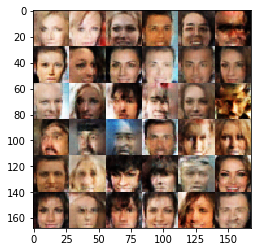

Epoch 1, step 4502 Discriminator Loss: 1.3896... Generator Loss: 0.4838
Epoch 1, step 4503 Discriminator Loss: 1.3152... Generator Loss: 0.6277
Epoch 1, step 4504 Discriminator Loss: 2.0097... Generator Loss: 0.2264
Epoch 1, step 4505 Discriminator Loss: 1.4052... Generator Loss: 0.5287
Epoch 1, step 4506 Discriminator Loss: 1.3569... Generator Loss: 0.5486
Epoch 1, step 4507 Discriminator Loss: 1.6700... Generator Loss: 0.3512
Epoch 1, step 4508 Discriminator Loss: 1.2671... Generator Loss: 0.6101
Epoch 1, step 4509 Discriminator Loss: 1.5812... Generator Loss: 0.4249
Epoch 1, step 4510 Discriminator Loss: 1.1941... Generator Loss: 0.7239
Epoch 1, step 4511 Discriminator Loss: 1.3615... Generator Loss: 0.4977
Epoch 1, step 4512 Discriminator Loss: 1.3204... Generator Loss: 0.5274
Epoch 1, step 4513 Discriminator Loss: 1.1579... Generator Loss: 0.6772
Epoch 1, step 4514 Discriminator Loss: 1.6220... Generator Loss: 0.3552
Epoch 1, step 4515 Discriminator Loss: 1.1987... Generator Loss:

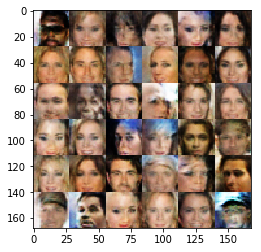

Epoch 1, step 4602 Discriminator Loss: 2.2131... Generator Loss: 0.1950
Epoch 1, step 4603 Discriminator Loss: 1.4920... Generator Loss: 0.4428
Epoch 1, step 4604 Discriminator Loss: 1.3531... Generator Loss: 0.5524
Epoch 1, step 4605 Discriminator Loss: 1.6077... Generator Loss: 0.3970
Epoch 1, step 4606 Discriminator Loss: 2.2103... Generator Loss: 0.1887
Epoch 1, step 4607 Discriminator Loss: 1.1858... Generator Loss: 0.9897
Epoch 1, step 4608 Discriminator Loss: 1.4622... Generator Loss: 0.4585
Epoch 1, step 4609 Discriminator Loss: 1.8192... Generator Loss: 0.2999
Epoch 1, step 4610 Discriminator Loss: 1.2296... Generator Loss: 0.6135
Epoch 1, step 4611 Discriminator Loss: 1.3007... Generator Loss: 0.5820
Epoch 1, step 4612 Discriminator Loss: 1.8075... Generator Loss: 0.2862
Epoch 1, step 4613 Discriminator Loss: 1.3269... Generator Loss: 0.5247
Epoch 1, step 4614 Discriminator Loss: 1.2567... Generator Loss: 0.6532
Epoch 1, step 4615 Discriminator Loss: 1.0675... Generator Loss:

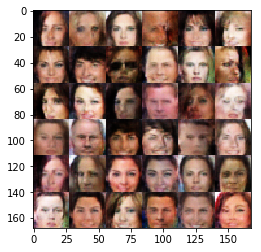

Epoch 1, step 4702 Discriminator Loss: 2.2899... Generator Loss: 0.1844
Epoch 1, step 4703 Discriminator Loss: 1.2489... Generator Loss: 0.8704
Epoch 1, step 4704 Discriminator Loss: 1.3502... Generator Loss: 0.6202
Epoch 1, step 4705 Discriminator Loss: 1.5992... Generator Loss: 0.3887
Epoch 1, step 4706 Discriminator Loss: 1.4041... Generator Loss: 0.5351
Epoch 1, step 4707 Discriminator Loss: 1.2372... Generator Loss: 0.6797
Epoch 1, step 4708 Discriminator Loss: 1.8231... Generator Loss: 0.2804
Epoch 1, step 4709 Discriminator Loss: 2.1757... Generator Loss: 0.2045
Epoch 1, step 4710 Discriminator Loss: 1.0164... Generator Loss: 1.6127
Epoch 1, step 4711 Discriminator Loss: 1.3417... Generator Loss: 0.5345
Epoch 1, step 4712 Discriminator Loss: 1.4124... Generator Loss: 0.4676
Epoch 1, step 4713 Discriminator Loss: 1.3075... Generator Loss: 0.6267
Epoch 1, step 4714 Discriminator Loss: 1.2128... Generator Loss: 0.7172
Epoch 1, step 4715 Discriminator Loss: 1.8958... Generator Loss:

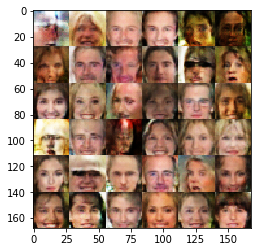

Epoch 1, step 4802 Discriminator Loss: 1.6220... Generator Loss: 0.3653
Epoch 1, step 4803 Discriminator Loss: 1.3052... Generator Loss: 0.6132
Epoch 1, step 4804 Discriminator Loss: 1.1296... Generator Loss: 0.6959
Epoch 1, step 4805 Discriminator Loss: 1.4648... Generator Loss: 0.4906
Epoch 1, step 4806 Discriminator Loss: 1.8047... Generator Loss: 0.3089
Epoch 1, step 4807 Discriminator Loss: 1.5762... Generator Loss: 0.4273
Epoch 1, step 4808 Discriminator Loss: 1.3399... Generator Loss: 0.8207
Epoch 1, step 4809 Discriminator Loss: 1.9090... Generator Loss: 0.2689
Epoch 1, step 4810 Discriminator Loss: 1.5636... Generator Loss: 0.3919
Epoch 1, step 4811 Discriminator Loss: 1.6418... Generator Loss: 0.3638
Epoch 1, step 4812 Discriminator Loss: 1.2296... Generator Loss: 0.8050
Epoch 1, step 4813 Discriminator Loss: 1.3368... Generator Loss: 0.5225
Epoch 1, step 4814 Discriminator Loss: 1.7761... Generator Loss: 0.2953
Epoch 1, step 4815 Discriminator Loss: 1.3532... Generator Loss:

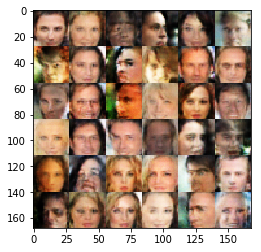

Epoch 1, step 4902 Discriminator Loss: 1.6399... Generator Loss: 0.3581
Epoch 1, step 4903 Discriminator Loss: 1.3434... Generator Loss: 0.7136
Epoch 1, step 4904 Discriminator Loss: 1.9715... Generator Loss: 0.2600
Epoch 1, step 4905 Discriminator Loss: 1.4337... Generator Loss: 0.4752
Epoch 1, step 4906 Discriminator Loss: 1.0811... Generator Loss: 0.9958
Epoch 1, step 4907 Discriminator Loss: 1.5544... Generator Loss: 0.4228
Epoch 1, step 4908 Discriminator Loss: 1.5514... Generator Loss: 0.4020
Epoch 1, step 4909 Discriminator Loss: 1.4972... Generator Loss: 0.4458
Epoch 1, step 4910 Discriminator Loss: 1.7472... Generator Loss: 0.3338
Epoch 1, step 4911 Discriminator Loss: 0.8533... Generator Loss: 1.2641
Epoch 1, step 4912 Discriminator Loss: 1.3088... Generator Loss: 0.6327
Epoch 1, step 4913 Discriminator Loss: 1.7055... Generator Loss: 0.3296
Epoch 1, step 4914 Discriminator Loss: 1.7624... Generator Loss: 0.3087
Epoch 1, step 4915 Discriminator Loss: 1.3241... Generator Loss:

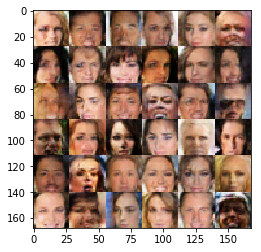

Epoch 1, step 5002 Discriminator Loss: 1.6469... Generator Loss: 0.3667
Epoch 1, step 5003 Discriminator Loss: 1.4318... Generator Loss: 0.4451
Epoch 1, step 5004 Discriminator Loss: 1.1129... Generator Loss: 0.8792
Epoch 1, step 5005 Discriminator Loss: 1.4757... Generator Loss: 0.4400
Epoch 1, step 5006 Discriminator Loss: 1.6225... Generator Loss: 0.3563
Epoch 1, step 5007 Discriminator Loss: 0.9275... Generator Loss: 0.9349
Epoch 1, step 5008 Discriminator Loss: 1.0740... Generator Loss: 0.7625
Epoch 1, step 5009 Discriminator Loss: 1.3285... Generator Loss: 0.5466
Epoch 1, step 5010 Discriminator Loss: 1.7469... Generator Loss: 0.3095
Epoch 1, step 5011 Discriminator Loss: 1.0881... Generator Loss: 0.9647
Epoch 1, step 5012 Discriminator Loss: 1.0950... Generator Loss: 0.7585
Epoch 1, step 5013 Discriminator Loss: 1.1363... Generator Loss: 0.6933
Epoch 1, step 5014 Discriminator Loss: 2.3076... Generator Loss: 0.1836
Epoch 1, step 5015 Discriminator Loss: 1.1415... Generator Loss:

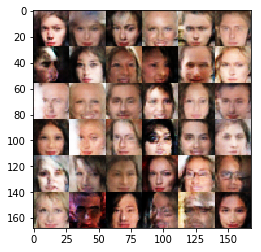

Epoch 1, step 5102 Discriminator Loss: 1.6462... Generator Loss: 0.3597
Epoch 1, step 5103 Discriminator Loss: 2.5289... Generator Loss: 0.1285
Epoch 1, step 5104 Discriminator Loss: 1.1585... Generator Loss: 1.9565
Epoch 1, step 5105 Discriminator Loss: 1.2555... Generator Loss: 0.5879
Epoch 1, step 5106 Discriminator Loss: 1.9867... Generator Loss: 0.2481
Epoch 1, step 5107 Discriminator Loss: 1.0250... Generator Loss: 1.5275
Epoch 1, step 5108 Discriminator Loss: 1.5896... Generator Loss: 0.4559
Epoch 1, step 5109 Discriminator Loss: 2.2044... Generator Loss: 0.2082
Epoch 1, step 5110 Discriminator Loss: 1.2444... Generator Loss: 0.5558
Epoch 1, step 5111 Discriminator Loss: 2.0277... Generator Loss: 0.2742
Epoch 1, step 5112 Discriminator Loss: 1.6945... Generator Loss: 0.3671
Epoch 1, step 5113 Discriminator Loss: 1.7556... Generator Loss: 0.3237
Epoch 1, step 5114 Discriminator Loss: 1.2117... Generator Loss: 0.5734
Epoch 1, step 5115 Discriminator Loss: 1.3640... Generator Loss:

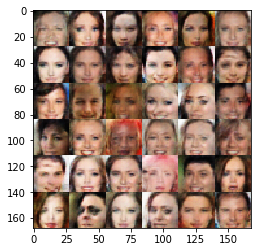

Epoch 1, step 5202 Discriminator Loss: 0.8600... Generator Loss: 1.1940
Epoch 1, step 5203 Discriminator Loss: 1.2428... Generator Loss: 0.5863
Epoch 1, step 5204 Discriminator Loss: 1.9335... Generator Loss: 0.2535
Epoch 1, step 5205 Discriminator Loss: 1.2872... Generator Loss: 0.6005
Epoch 1, step 5206 Discriminator Loss: 1.2493... Generator Loss: 0.5697
Epoch 1, step 5207 Discriminator Loss: 1.0285... Generator Loss: 0.9086
Epoch 1, step 5208 Discriminator Loss: 1.7487... Generator Loss: 0.3264
Epoch 1, step 5209 Discriminator Loss: 1.7866... Generator Loss: 0.3034
Epoch 1, step 5210 Discriminator Loss: 0.9468... Generator Loss: 0.9366
Epoch 1, step 5211 Discriminator Loss: 1.7397... Generator Loss: 0.3725
Epoch 1, step 5212 Discriminator Loss: 1.1022... Generator Loss: 0.7093
Epoch 1, step 5213 Discriminator Loss: 1.3959... Generator Loss: 0.4849
Epoch 1, step 5214 Discriminator Loss: 2.3101... Generator Loss: 0.1730
Epoch 1, step 5215 Discriminator Loss: 1.5478... Generator Loss:

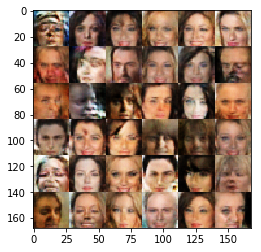

Epoch 1, step 5302 Discriminator Loss: 1.2942... Generator Loss: 0.5451
Epoch 1, step 5303 Discriminator Loss: 1.2669... Generator Loss: 0.5773
Epoch 1, step 5304 Discriminator Loss: 1.5551... Generator Loss: 0.3813
Epoch 1, step 5305 Discriminator Loss: 1.2424... Generator Loss: 0.6322
Epoch 1, step 5306 Discriminator Loss: 1.9216... Generator Loss: 0.2718
Epoch 1, step 5307 Discriminator Loss: 1.5698... Generator Loss: 0.3812
Epoch 1, step 5308 Discriminator Loss: 1.9304... Generator Loss: 0.2497
Epoch 1, step 5309 Discriminator Loss: 1.3886... Generator Loss: 0.5464
Epoch 1, step 5310 Discriminator Loss: 1.2604... Generator Loss: 0.6103
Epoch 1, step 5311 Discriminator Loss: 1.9815... Generator Loss: 0.2436
Epoch 1, step 5312 Discriminator Loss: 1.2054... Generator Loss: 0.9103
Epoch 1, step 5313 Discriminator Loss: 1.3675... Generator Loss: 0.5114
Epoch 1, step 5314 Discriminator Loss: 2.1756... Generator Loss: 0.2034
Epoch 1, step 5315 Discriminator Loss: 1.1215... Generator Loss:

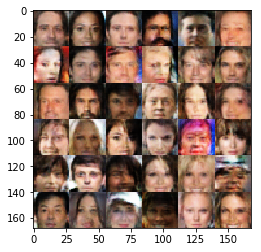

Epoch 1, step 5402 Discriminator Loss: 1.4108... Generator Loss: 0.5033
Epoch 1, step 5403 Discriminator Loss: 1.6574... Generator Loss: 0.3545
Epoch 1, step 5404 Discriminator Loss: 1.0900... Generator Loss: 0.6727
Epoch 1, step 5405 Discriminator Loss: 1.2294... Generator Loss: 0.6353
Epoch 1, step 5406 Discriminator Loss: 1.5962... Generator Loss: 0.3878
Epoch 1, step 5407 Discriminator Loss: 2.2251... Generator Loss: 0.1874
Epoch 1, step 5408 Discriminator Loss: 1.6559... Generator Loss: 0.4609
Epoch 1, step 5409 Discriminator Loss: 1.4972... Generator Loss: 0.4637
Epoch 1, step 5410 Discriminator Loss: 1.4588... Generator Loss: 0.4813
Epoch 1, step 5411 Discriminator Loss: 2.0409... Generator Loss: 0.2306
Epoch 1, step 5412 Discriminator Loss: 1.3647... Generator Loss: 0.6411
Epoch 1, step 5413 Discriminator Loss: 1.3306... Generator Loss: 0.5392
Epoch 1, step 5414 Discriminator Loss: 1.7616... Generator Loss: 0.3151
Epoch 1, step 5415 Discriminator Loss: 1.1076... Generator Loss:

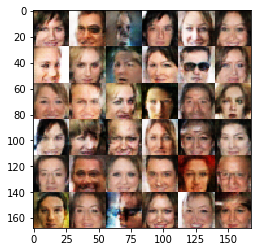

Epoch 1, step 5502 Discriminator Loss: 1.9778... Generator Loss: 0.2561
Epoch 1, step 5503 Discriminator Loss: 1.1908... Generator Loss: 0.8904
Epoch 1, step 5504 Discriminator Loss: 1.5662... Generator Loss: 0.3894
Epoch 1, step 5505 Discriminator Loss: 2.5154... Generator Loss: 0.1376
Epoch 1, step 5506 Discriminator Loss: 0.8946... Generator Loss: 1.6554
Epoch 1, step 5507 Discriminator Loss: 1.6540... Generator Loss: 0.3784
Epoch 1, step 5508 Discriminator Loss: 1.5862... Generator Loss: 0.3732
Epoch 1, step 5509 Discriminator Loss: 1.3222... Generator Loss: 0.6185
Epoch 1, step 5510 Discriminator Loss: 1.4006... Generator Loss: 0.5202
Epoch 1, step 5511 Discriminator Loss: 1.7978... Generator Loss: 0.3142
Epoch 1, step 5512 Discriminator Loss: 2.0886... Generator Loss: 0.2129
Epoch 1, step 5513 Discriminator Loss: 1.7973... Generator Loss: 0.4520
Epoch 1, step 5514 Discriminator Loss: 1.2375... Generator Loss: 0.6121
Epoch 1, step 5515 Discriminator Loss: 2.0504... Generator Loss:

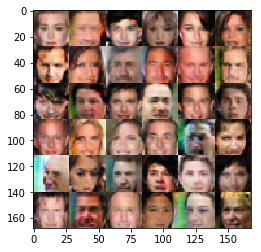

Epoch 1, step 5602 Discriminator Loss: 1.7976... Generator Loss: 0.3184
Epoch 1, step 5603 Discriminator Loss: 1.8502... Generator Loss: 0.2942
Epoch 1, step 5604 Discriminator Loss: 1.5467... Generator Loss: 0.4006
Epoch 1, step 5605 Discriminator Loss: 1.3724... Generator Loss: 0.5190
Epoch 1, step 5606 Discriminator Loss: 2.1341... Generator Loss: 0.2015
Epoch 1, step 5607 Discriminator Loss: 1.7236... Generator Loss: 0.3134
Epoch 1, step 5608 Discriminator Loss: 1.2296... Generator Loss: 0.8526
Epoch 1, step 5609 Discriminator Loss: 2.0540... Generator Loss: 0.2364
Epoch 1, step 5610 Discriminator Loss: 0.9778... Generator Loss: 1.8425
Epoch 1, step 5611 Discriminator Loss: 1.5197... Generator Loss: 0.4535
Epoch 1, step 5612 Discriminator Loss: 1.5913... Generator Loss: 0.4085
Epoch 1, step 5613 Discriminator Loss: 1.3593... Generator Loss: 0.5582
Epoch 1, step 5614 Discriminator Loss: 1.5018... Generator Loss: 0.4214
Epoch 1, step 5615 Discriminator Loss: 1.5062... Generator Loss:

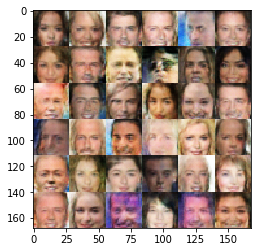

Epoch 1, step 5702 Discriminator Loss: 2.5486... Generator Loss: 0.1378
Epoch 1, step 5703 Discriminator Loss: 1.1999... Generator Loss: 1.7906
Epoch 1, step 5704 Discriminator Loss: 1.0576... Generator Loss: 0.7624
Epoch 1, step 5705 Discriminator Loss: 1.6096... Generator Loss: 0.4057
Epoch 1, step 5706 Discriminator Loss: 1.1284... Generator Loss: 0.7132
Epoch 1, step 5707 Discriminator Loss: 1.2430... Generator Loss: 0.5724
Epoch 1, step 5708 Discriminator Loss: 1.3481... Generator Loss: 0.5087
Epoch 1, step 5709 Discriminator Loss: 2.0524... Generator Loss: 0.2165
Epoch 1, step 5710 Discriminator Loss: 1.3073... Generator Loss: 0.7031
Epoch 1, step 5711 Discriminator Loss: 1.7562... Generator Loss: 0.3179
Epoch 1, step 5712 Discriminator Loss: 1.7439... Generator Loss: 0.3258
Epoch 1, step 5713 Discriminator Loss: 1.2978... Generator Loss: 0.5244
Epoch 1, step 5714 Discriminator Loss: 1.4313... Generator Loss: 0.4659
Epoch 1, step 5715 Discriminator Loss: 1.7849... Generator Loss:

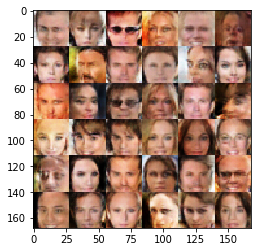

Epoch 1, step 5802 Discriminator Loss: 1.1245... Generator Loss: 1.2193
Epoch 1, step 5803 Discriminator Loss: 1.6249... Generator Loss: 0.3647
Epoch 1, step 5804 Discriminator Loss: 1.3271... Generator Loss: 0.5565
Epoch 1, step 5805 Discriminator Loss: 1.6236... Generator Loss: 0.3504
Epoch 1, step 5806 Discriminator Loss: 1.7459... Generator Loss: 0.3224
Epoch 1, step 5807 Discriminator Loss: 1.2310... Generator Loss: 0.5776
Epoch 1, step 5808 Discriminator Loss: 0.9241... Generator Loss: 1.0345
Epoch 1, step 5809 Discriminator Loss: 1.6238... Generator Loss: 0.3565
Epoch 1, step 5810 Discriminator Loss: 1.3280... Generator Loss: 0.5116
Epoch 1, step 5811 Discriminator Loss: 1.8986... Generator Loss: 0.2660
Epoch 1, step 5812 Discriminator Loss: 1.3647... Generator Loss: 0.4885
Epoch 1, step 5813 Discriminator Loss: 0.9550... Generator Loss: 0.8921
Epoch 1, step 5814 Discriminator Loss: 2.1414... Generator Loss: 0.2058
Epoch 1, step 5815 Discriminator Loss: 1.3376... Generator Loss:

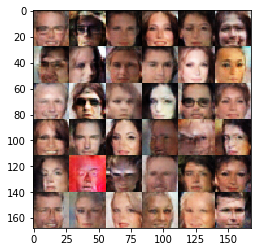

Epoch 1, step 5902 Discriminator Loss: 2.0906... Generator Loss: 0.2271
Epoch 1, step 5903 Discriminator Loss: 1.1715... Generator Loss: 1.0140
Epoch 1, step 5904 Discriminator Loss: 1.4704... Generator Loss: 0.4652
Epoch 1, step 5905 Discriminator Loss: 1.5864... Generator Loss: 0.4074
Epoch 1, step 5906 Discriminator Loss: 1.7083... Generator Loss: 0.3321
Epoch 1, step 5907 Discriminator Loss: 2.2066... Generator Loss: 0.1844
Epoch 1, step 5908 Discriminator Loss: 1.1552... Generator Loss: 0.8543
Epoch 1, step 5909 Discriminator Loss: 0.8616... Generator Loss: 1.1029
Epoch 1, step 5910 Discriminator Loss: 1.8736... Generator Loss: 0.2854
Epoch 1, step 5911 Discriminator Loss: 1.5189... Generator Loss: 0.4153
Epoch 1, step 5912 Discriminator Loss: 0.8181... Generator Loss: 1.2398
Epoch 1, step 5913 Discriminator Loss: 1.0275... Generator Loss: 0.8054
Epoch 1, step 5914 Discriminator Loss: 1.2621... Generator Loss: 0.5854
Epoch 1, step 5915 Discriminator Loss: 1.7975... Generator Loss:

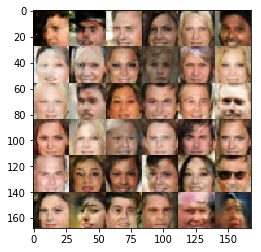

Epoch 1, step 6002 Discriminator Loss: 1.5420... Generator Loss: 0.3879
Epoch 1, step 6003 Discriminator Loss: 1.7102... Generator Loss: 0.3497
Epoch 1, step 6004 Discriminator Loss: 1.1984... Generator Loss: 0.6270
Epoch 1, step 6005 Discriminator Loss: 1.3019... Generator Loss: 0.5298
Epoch 1, step 6006 Discriminator Loss: 1.0519... Generator Loss: 1.0088
Epoch 1, step 6007 Discriminator Loss: 1.5954... Generator Loss: 0.3718
Epoch 1, step 6008 Discriminator Loss: 1.6261... Generator Loss: 0.3603
Epoch 1, step 6009 Discriminator Loss: 1.4298... Generator Loss: 0.4823
Epoch 1, step 6010 Discriminator Loss: 1.7125... Generator Loss: 0.3442
Epoch 1, step 6011 Discriminator Loss: 1.8087... Generator Loss: 0.3054
Epoch 1, step 6012 Discriminator Loss: 1.1805... Generator Loss: 0.7632
Epoch 1, step 6013 Discriminator Loss: 1.7225... Generator Loss: 0.3203
Epoch 1, step 6014 Discriminator Loss: 1.6284... Generator Loss: 0.3685
Epoch 1, step 6015 Discriminator Loss: 1.7898... Generator Loss:

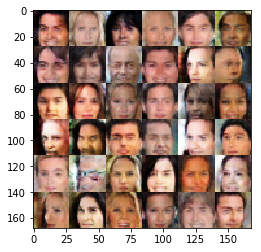

Epoch 1, step 6102 Discriminator Loss: 1.8008... Generator Loss: 0.2859
Epoch 1, step 6103 Discriminator Loss: 1.4912... Generator Loss: 0.4328
Epoch 1, step 6104 Discriminator Loss: 1.8358... Generator Loss: 0.2813
Epoch 1, step 6105 Discriminator Loss: 2.1298... Generator Loss: 0.2152
Epoch 1, step 6106 Discriminator Loss: 1.0426... Generator Loss: 1.8145
Epoch 1, step 6107 Discriminator Loss: 1.0934... Generator Loss: 0.7168
Epoch 1, step 6108 Discriminator Loss: 2.2125... Generator Loss: 0.1972
Epoch 1, step 6109 Discriminator Loss: 1.6580... Generator Loss: 0.4126
Epoch 1, step 6110 Discriminator Loss: 1.2917... Generator Loss: 0.7407
Epoch 1, step 6111 Discriminator Loss: 1.2229... Generator Loss: 0.5835
Epoch 1, step 6112 Discriminator Loss: 2.2453... Generator Loss: 0.2078
Epoch 1, step 6113 Discriminator Loss: 1.8779... Generator Loss: 0.2871
Epoch 1, step 6114 Discriminator Loss: 1.0576... Generator Loss: 1.4843
Epoch 1, step 6115 Discriminator Loss: 1.6012... Generator Loss:

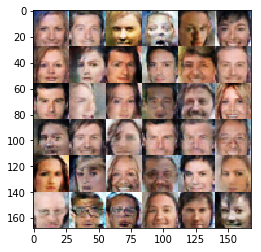

Epoch 1, step 6202 Discriminator Loss: 2.1272... Generator Loss: 0.2453
Epoch 1, step 6203 Discriminator Loss: 1.6269... Generator Loss: 0.3732
Epoch 1, step 6204 Discriminator Loss: 1.1539... Generator Loss: 0.8674
Epoch 1, step 6205 Discriminator Loss: 1.1619... Generator Loss: 0.6939
Epoch 1, step 6206 Discriminator Loss: 2.2296... Generator Loss: 0.1985
Epoch 1, step 6207 Discriminator Loss: 1.3837... Generator Loss: 0.5281
Epoch 1, step 6208 Discriminator Loss: 1.1178... Generator Loss: 0.8796
Epoch 1, step 6209 Discriminator Loss: 1.5836... Generator Loss: 0.4151
Epoch 1, step 6210 Discriminator Loss: 1.7966... Generator Loss: 0.3167
Epoch 1, step 6211 Discriminator Loss: 1.1337... Generator Loss: 0.7282
Epoch 1, step 6212 Discriminator Loss: 2.2381... Generator Loss: 0.1886
Epoch 1, step 6213 Discriminator Loss: 1.1324... Generator Loss: 0.8867
Epoch 1, step 6214 Discriminator Loss: 1.7504... Generator Loss: 0.3411
Epoch 1, step 6215 Discriminator Loss: 1.6830... Generator Loss:

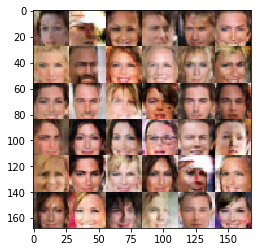

Epoch 1, step 6302 Discriminator Loss: 1.0556... Generator Loss: 0.9530
Epoch 1, step 6303 Discriminator Loss: 1.5608... Generator Loss: 0.4248
Epoch 1, step 6304 Discriminator Loss: 1.9697... Generator Loss: 0.2554
Epoch 1, step 6305 Discriminator Loss: 0.9224... Generator Loss: 1.2925
Epoch 1, step 6306 Discriminator Loss: 1.4644... Generator Loss: 0.4383
Epoch 1, step 6307 Discriminator Loss: 1.6089... Generator Loss: 0.3760
Epoch 1, step 6308 Discriminator Loss: 1.3505... Generator Loss: 0.5009
Epoch 1, step 6309 Discriminator Loss: 1.0670... Generator Loss: 1.5550
Epoch 1, step 6310 Discriminator Loss: 1.2992... Generator Loss: 0.5374
Epoch 1, step 6311 Discriminator Loss: 2.3681... Generator Loss: 0.1662
Epoch 1, step 6312 Discriminator Loss: 1.9480... Generator Loss: 0.2510
Epoch 1, step 6313 Discriminator Loss: 1.1046... Generator Loss: 0.9592
Epoch 1, step 6314 Discriminator Loss: 2.0634... Generator Loss: 0.2530
Epoch 1, step 6315 Discriminator Loss: 1.5825... Generator Loss:

In [ ]:
batch_size = 32
z_dim = 128
learning_rate = 0.0002
beta1 = 0.5

keep_prob = 0.8


# I modified below in order to add the parameter keep_prob and different learning rates for sgd and adam.

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, keep_prob, beta1,
          celeba_dataset.get_batches, celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.